# Mouse Brain Cell-Cell Interaction Network

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import plotnine as p9
import liana as li
import muon as mu
import anndata as ad
import matplotlib.pyplot as plt
import squidpy as sq
from liana.method._pipe_utils._common import _get_props
from liana.method.sp._utils import _add_complexes_to_var
from liana._logging import _logg
from liana.method._pipe_utils import prep_check_adata, assert_covered
from scipy.sparse import csr_matrix
from pathlib import Path

/home/alsayah/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
/home/alsayah/.local/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
/home/alsayah/.local/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.


In [2]:
merfish_path = Path("/g/stegle/aalsayah/repos/data/merfish")

In [3]:
adata_main = sc.read(merfish_path / "mouse_brain/WB_MERFISH_animal2_coronal.h5ad")

In [4]:
adata_main.obs["brain_section_label"].value_counts()

brain_section_label
C57BL6J-2.039    51545
C57BL6J-2.034    49115
C57BL6J-2.036    48221
C57BL6J-2.041    46938
C57BL6J-2.033    46079
                 ...  
C57BL6J-2.015    15505
C57BL6J-2.013    13206
C57BL6J-2.003    12325
C57BL6J-2.002    10450
C57BL6J-2.001     7861
Name: count, Length: 66, dtype: int64

In [173]:
adata = adata_main[adata_main.obs["brain_section_label"] == "C57BL6J-2.039"]

In [174]:
adata

View of AnnData object with n_obs × n_vars = 51545 × 1122
    obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'

### Inspect

/home/alsayah/.local/lib/python3.10/site-packages/scanpy/plotting/_utils.py:481: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


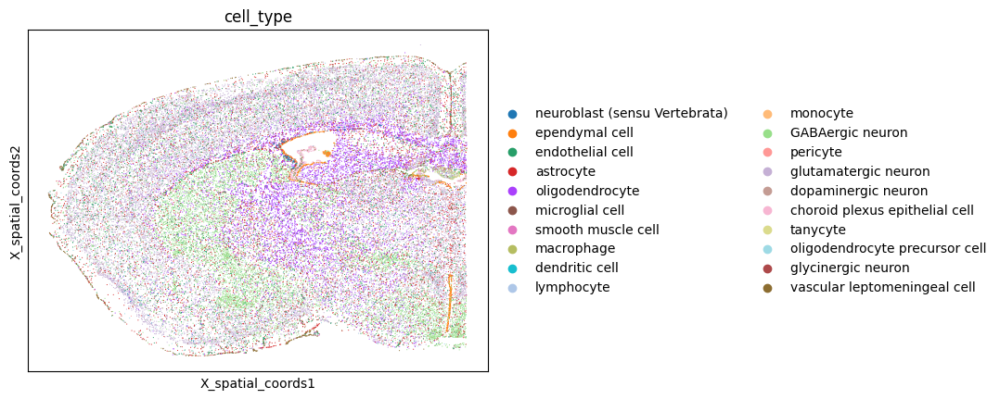

In [111]:
sc.pl.embedding(adata, basis="X_spatial_coords", color="cell_type")

/home/alsayah/.local/lib/python3.10/site-packages/scanpy/plotting/_utils.py:481: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


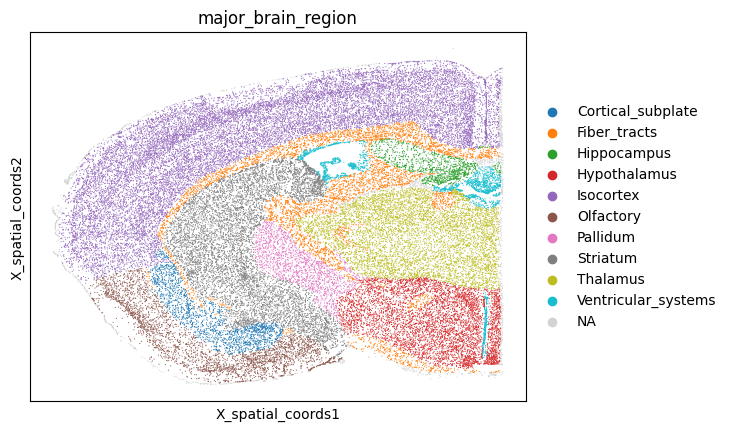

In [137]:
sc.pl.embedding(adata, basis="X_spatial_coords", color="major_brain_region")

In [175]:
import mygene
mg = mygene.MyGeneInfo()
query = mg.querymany(adata.var_names.tolist(),
                     scopes="ensembl.gene",
                     fields="symbol",
                     species="mouse")

# Make a mapping dictionary {ensembl_id: symbol}
mapping = {q['query']: q.get('symbol', q['query']) for q in query}

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
querying 1-1000 ...
HTTP Request: POST https://mygene.info/v3/query/ "HTTP/1.1 200 OK"
querying 1001-1122 ...
HTTP Request: POST https://mygene.info/v3/query/ "HTTP/1.1 200 OK"
Finished.
2 input query terms found no hit:	['ENSMUSG00000109473', 'ENSMUSG00000113186']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [176]:
adata.var_names = [mapping.get(gid, gid) for gid in adata.var_names]

In [185]:
adata.var_names

Index(['Htr7', 'Gzmk', 'Arhgap36', 'Sema3c', 'Rxrg', 'Itga8', 'Glp2r', 'Ramp3',
       'Car12', 'Chn2',
       ...
       'Galnt14', 'Kcnh8', 'Cimap3', 'Epb41l4a', 'Matn2', 'Gata3', 'Fat1',
       'Zim1', 'Lmo1', 'Cntnap3'],
      dtype='object', length=1122)

In [ ]:
"Epha" in adata.var_names

True

In [115]:
sc.pp.normalize_total(adata, target_sum=1e4)   # library-size normalize
sc.pp.log1p(adata)                             # log-transform

In [116]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    dendrogram=True,
    use_raw=False,          # <- key change
)

KeyError: 'rank_genes_groups'

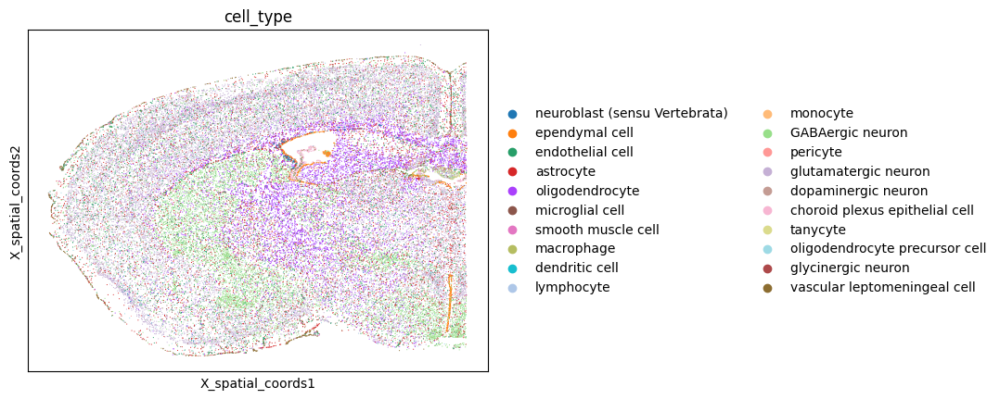

In [117]:
sc.pl.embedding(adata, basis="X_spatial_coords", color="cell_type", use_raw=False)

In [157]:
adata_astro = adata[adata.obs["cell_type"] == "astrocyte"]

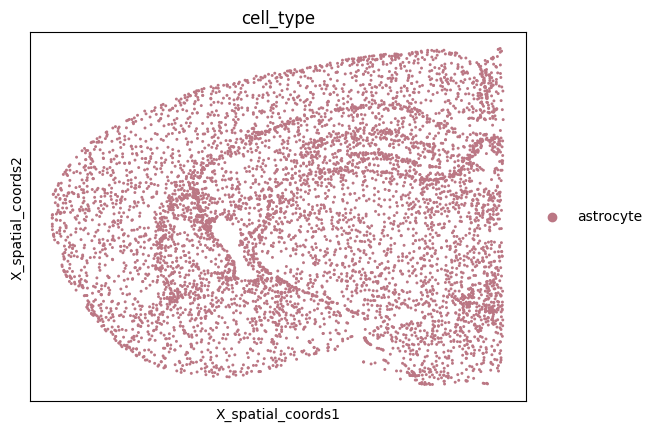

In [159]:
sc.pl.embedding(adata_astro, basis="X_spatial_coords", color="cell_type", use_raw=False)

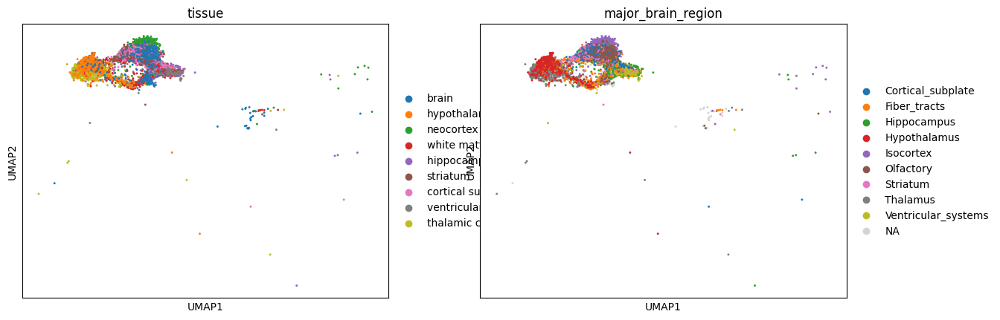

In [166]:
sc.pl.umap(adata_astro, color=["tissue", "major_brain_region"])

In [167]:
%%time
# PCA for dimension reduction further by UMAP for downstream analysis
sc.pp.pca(adata_astro, n_comps=30)
sc.pp.neighbors(adata_astro, metric="cosine")

CPU times: user 2.48 s, sys: 3.32 ms, total: 2.48 s
Wall time: 2.25 s


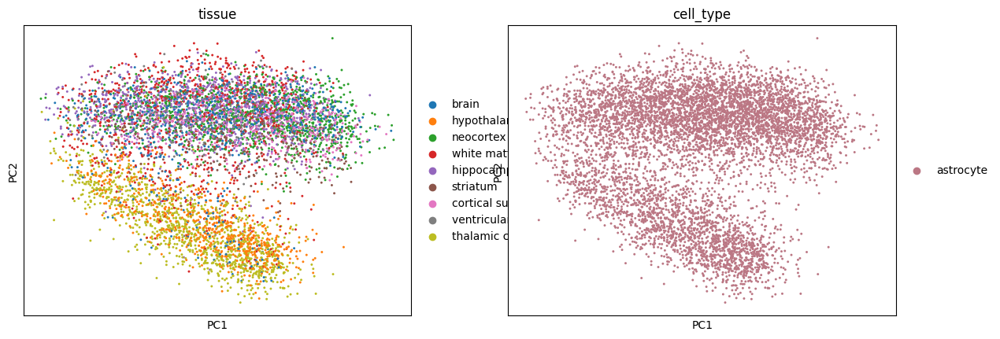

CPU times: user 11.8 s, sys: 26.9 ms, total: 11.9 s
Wall time: 11.8 s


<Axes: title={'center': 'cell_type'}, xlabel='UMAP1', ylabel='UMAP2'>

In [168]:
%%time
sc.tl.umap(adata_astro)
sc.pl.pca(adata_astro, color=['tissue', 'cell_type'])
sc.pl.umap(
    adata_astro, 
    color="cell_type", 
    ax=axes[0], 
     legend_loc=None,
    show=False
)

In [171]:
# Clustering (Leiden; try a few resolutions)
for res in (0.4, 0.8, 1.2):
    sc.tl.leiden(adata_astro, key_added=f"leiden_{res}", resolution=res)

/scratch/jobs/38729239/ipykernel_3672153/3630299358.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


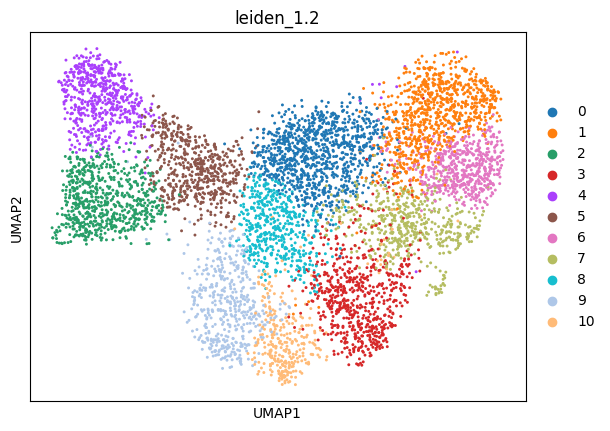

In [174]:
# Pick one to proceed with
cluster_key = "leiden_1.2"

# Plot
sc.pl.umap(adata_astro, color=[cluster_key], wspace=0.4)

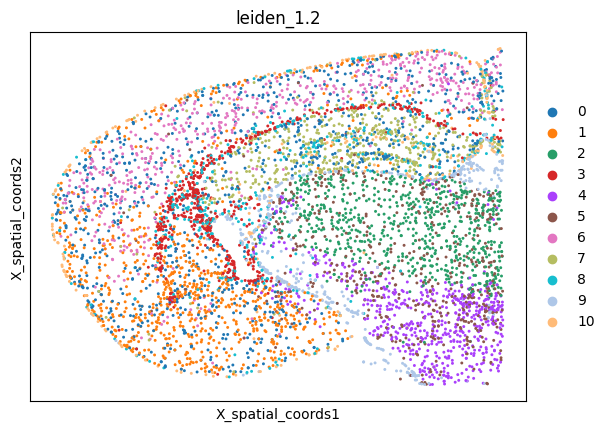

In [178]:
sc.pl.embedding(adata_astro, basis="X_spatial_coords", color="leiden_1.2", use_raw=False)

In [180]:
sc.pp.normalize_total(adata_astro, target_sum=1e4)   # library-size normalize
sc.pp.log1p(adata_astro)    

categories: 0, 1, 2, etc.
var_group_labels: glutamatergic neuron, oligodendrocyte, astrocyte, etc.


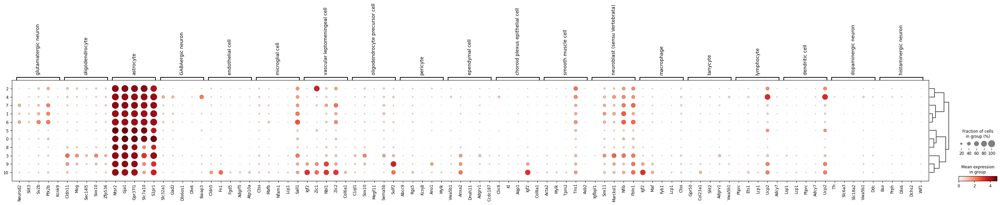

In [184]:
sc.pl.rank_genes_groups_dotplot(
    adata_astro,
    n_genes=5,
    dendrogram=True,
    use_raw=False,
    groupby="leiden_1.2"
)

In [163]:
# color mapping for "tissue" using the palette from "major_brain_region"
tissue_colors = {
    "brain": "#c7c7c7",  # NA
    "hypothalamus": "#d62728",  # Hypothalamus
    "neocortex": "#9467bd",  # Isocortex
    "white matter": "#ff7f0e",  # Fiber_tracts
    "hippocampal formation": "#2ca02c",  # Hippocampus
    "striatum": "#e377c2",  # Striatum
    "cortical subplate": "#1f77b4",  # Cortical_subplate
    "ventricular system of brain": "#bcbd22",  # Ventricular_systems
    "thalamic complex": "#7f7f7f",  # Thalamus
    "pallidum": "#17becf"
}


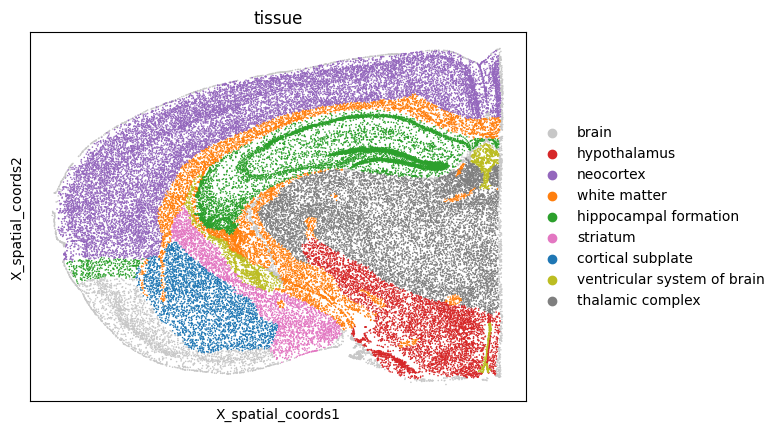

In [11]:
sc.pl.embedding(adata, basis="X_spatial_coords", color="tissue",
                palette=[tissue_colors[t] for t in adata.obs["tissue"].cat.categories],
                  s=5) 

In [12]:
# color mapping for "tissue" using the palette from "major_brain_region"
region_colors = {
    "Olfactory": "#c7c7c7",  # NA
    "Hypothalamus": "#d62728",  # Hypothalamus
    "Isocortex": "#9467bd",  # Isocortex
    "Fiber_tracts": "#ff7f0e",  # Fiber_tracts
    "Hippocampus": "#2ca02c",  # Hippocampus
    "Striatum": "#e377c2",  # Striatum
    "Cortical_subplate": "#1f77b4",  # Cortical_subplate
    "Ventricular_systems": "#bcbd22",  # Ventricular_systems
    "Thalamus": "#7f7f7f",  # Thalamus
    "Pallidum": "#17becf"
}


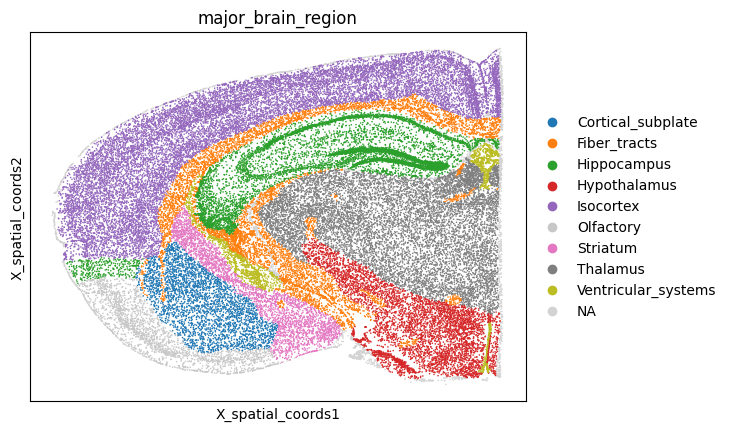

In [13]:
sc.pl.embedding(adata, basis="X_spatial_coords", color="major_brain_region",
                palette=[region_colors[t] for t in adata.obs["major_brain_region"].cat.categories],
                  s=5) 

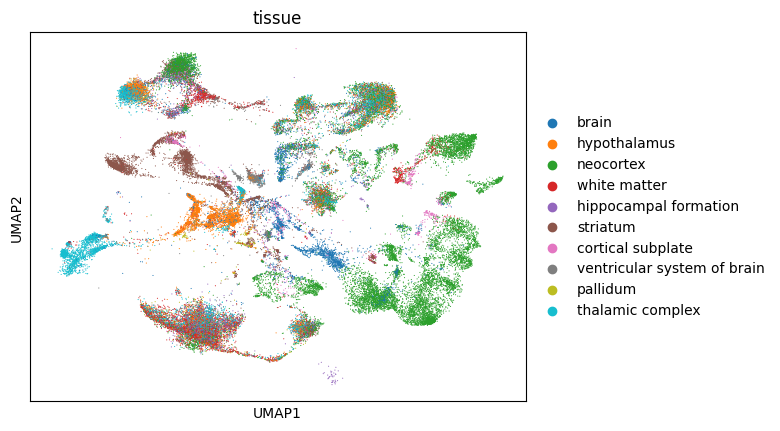

In [118]:
sc.pl.umap(adata, color=["tissue"])

/scratch/jobs/38878331/ipykernel_272613/1702754976.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


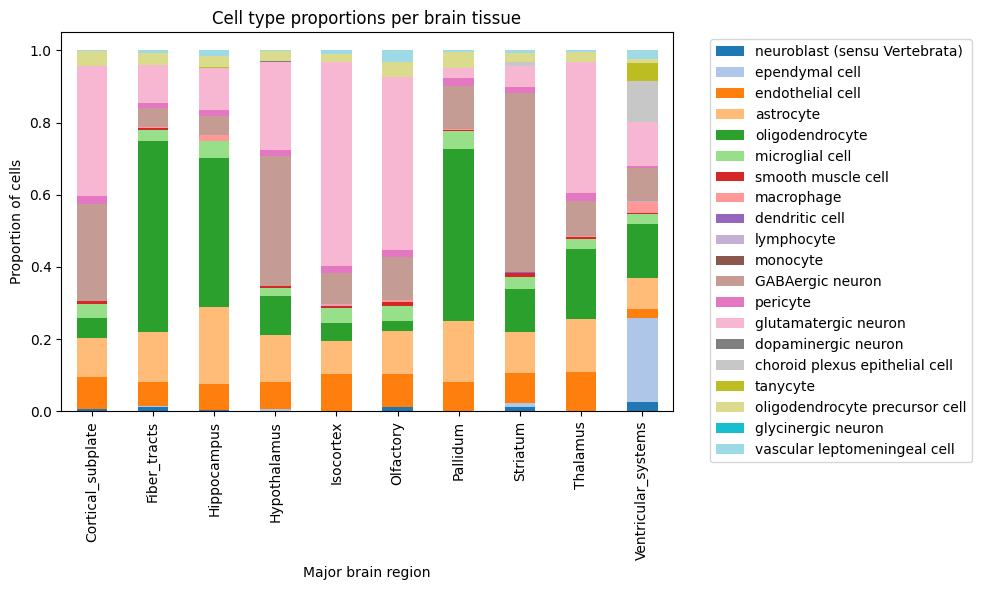

In [119]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Same proportions table from before
counts = pd.crosstab(adata.obs["major_brain_region"], adata.obs["cell_type"])
proportions = counts.div(counts.sum(axis=1), axis=0)

# Generate a colormap with as many unique colors as cell types
n_cell_types = proportions.shape[1]
cmap = cm.get_cmap("tab20", n_cell_types)  # "tab20" has 20 distinct colors
colors = [cmap(i) for i in range(n_cell_types)]

# Plot stacked bar chart
proportions.plot(
    kind="bar", 
    stacked=True, 
    figsize=(10, 6), 
    color=colors
)

plt.ylabel("Proportion of cells")
plt.xlabel("Major brain region")
plt.title("Cell type proportions per brain tissue")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


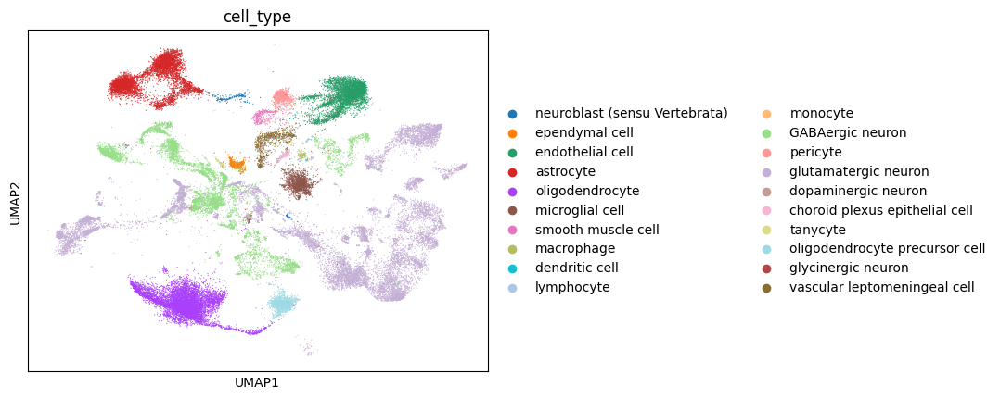

In [120]:
sc.pl.umap(adata, color=["cell_type"])

### Create mouse LR list

In [121]:
resource = li.rs.select_resource('consensus')
map_df = li.rs.get_hcop_orthologs(url='https://ftp.ebi.ac.uk/pub/databases/genenames/hcop/human_mouse_hcop_fifteen_column.txt.gz',
                                  columns=['human_symbol', 'mouse_symbol'],
                                   # NOTE: HCOP integrates multiple resource, so we can filter out mappings in at least 3 of them for confidence
                                   min_evidence=3
                                   )
map_df = map_df.rename(columns={'human_symbol':'source', 'mouse_symbol':'target'})
# We will then translate
mouse = li.rs.translate_resource(resource,
                                 map_df=map_df,
                                 columns=['ligand', 'receptor'],
                                 replace=True,
                                 # Here, we will be harsher and only keep mappings that don't map to more than 1 mouse gene
                                 one_to_many=1
                                 )
mouse
mouse.tuples = list(zip(mouse["ligand"], mouse["receptor"]))

/g/stegle/aalsayah/repos/liana-py/liana/resource/_orthology.py:199: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
/scratch/jobs/38878331/ipykernel_272613/2507512555.py:17: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access


In [145]:
mouse

,ligand,receptor
0,Lgals9,Ptprc
1,Lgals9,Met
2,Lgals9,Cd44
3,Lgals9,Lrp1
4,Lgals9,Cd47
...,...,...
4619,Bmp2,Actr2
4620,Bmp15,Actr2
4621,Csf1,Csf3r
4622,Il36g,Ifnar1


In [163]:
"Lgals9" in mouse["ligand"].values

True

In [166]:
gene = "Cx3cl1" 
gene in mouse["receptor"].values, gene in mouse["ligand"].values

(False, True)

### Preprocess for inflow

#### Choose bandwith

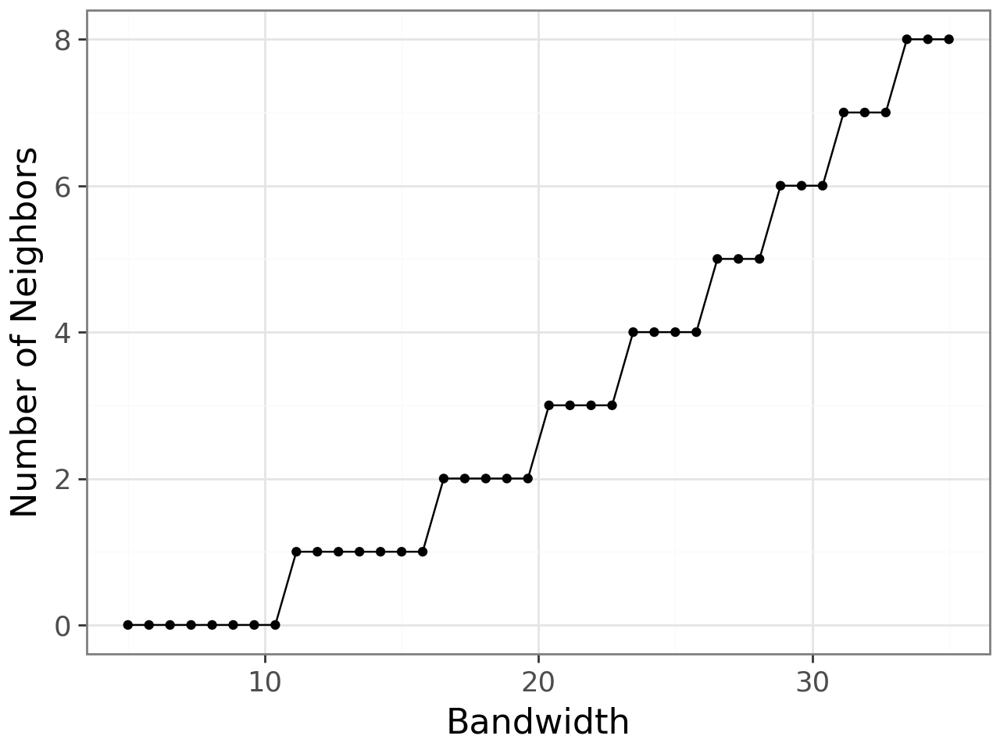

In [122]:
# around the sweet spot you explored
plot, df = li.ut.query_bandwidth(
    coordinates=adata.obsm["X_spatial_coords"],
    start=5,          # small positive (avoid 0)
    end=35,           # ~3× median NN
    interval_n=40     # many points for a smooth curve
)
plot

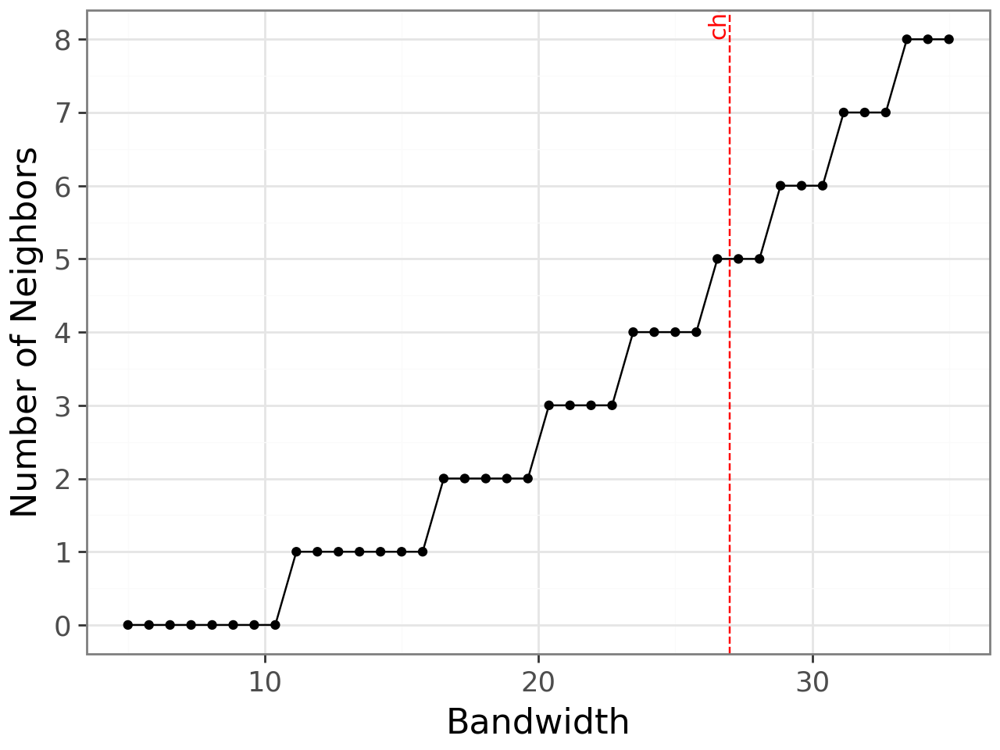

In [ ]:
from plotnine import scale_y_continuous
from plotnine import geom_vline, annotate

chosen = 27
plot + geom_vline(xintercept=chosen, linetype="dashed", color="red") + \
       annotate("text", x=chosen, y=df.neighbours.max(), 
                label=f"chosen={chosen}µm",
                angle=90, va="bottom", ha="right", color="red") + \
       scale_y_continuous(breaks=range(int(df.neighbours.min()), 
                                       int(df.neighbours.max())+1))

#### Spatial neighbors

In [124]:
li.ut.spatial_neighbors(adata=adata, bandwidth=26, spatial_key="X_spatial_coords")

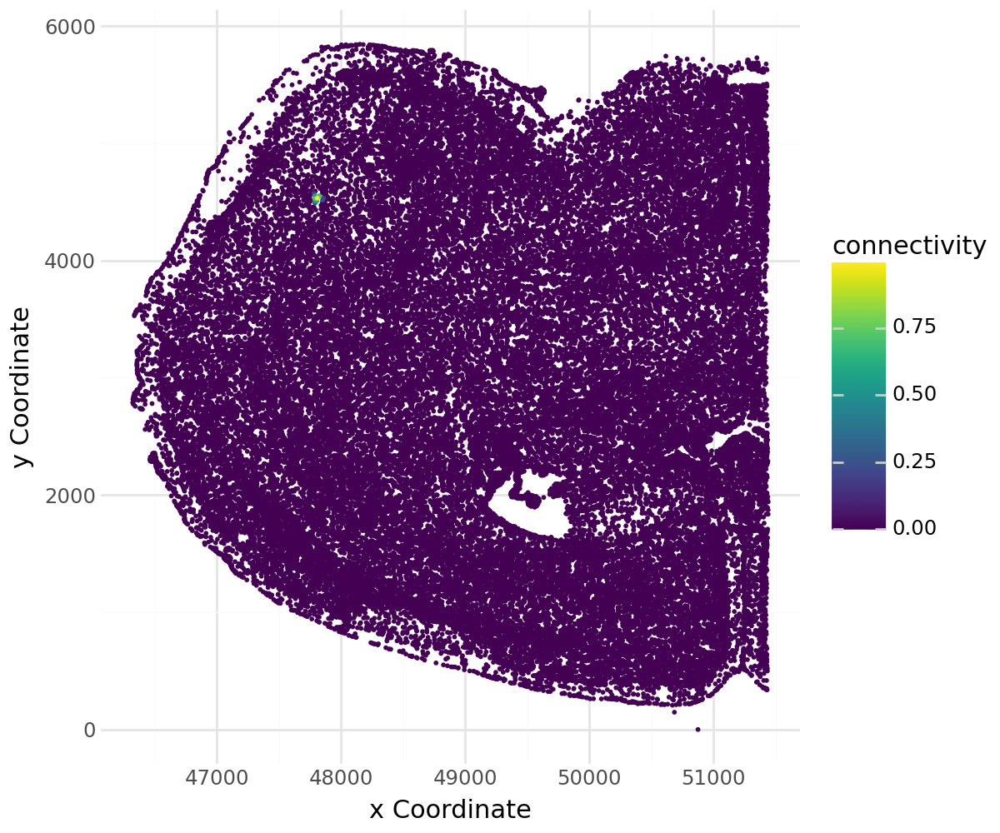

In [125]:
li.pl.connectivity(adata, idx=7000, size=0.2, figure_size=(6, 5), spatial_key="X_spatial_coords")

In [126]:
sq.gr.spatial_autocorr(adata, mode='moran', use_raw=False, n_jobs = 10,
                       show_progress_bar=True)
adata.uns['moranI']

,I,pval_norm,var_norm,pval_norm_fdr_bh
Slc17a7,0.642227,0.000000,0.000003,0.000000
Shox2,0.467719,0.000000,0.000003,0.000000
Baiap3,0.463782,0.000000,0.000003,0.000000
Calb2,0.452911,0.000000,0.000003,0.000000
Neurod2,0.450576,0.000000,0.000003,0.000000
...,...,...,...,...
Slc6a5,-0.000475,0.394716,0.000003,0.396128
A630012P03Rik,-0.000482,0.393029,0.000003,0.394788
Arhgef38,-0.000690,0.347076,0.000003,0.349255
Cubn,-0.000714,0.341826,0.000003,0.344281


In [5]:
## Check how many spatially variable genes (SVGs)
svgs = adata.uns['moranI'].index[(adata.uns['moranI']['pval_norm_fdr_bh'] < 0.05) & (adata.uns['moranI']['I'] > 0.01)]
len(svgs)

NameError: name 'adata' is not defined

In [128]:
adata = adata[:, svgs]

### Mouse inflow

In [129]:
adata.var_names

Index(['Slc17a7', 'Shox2', 'Baiap3', 'Calb2', 'Neurod2', 'Satb2', 'Zic1',
       'Lrrc10b', 'Mef2c', 'Syndig1l',
       ...
       'Cd44', 'C1qtnf7', 'Diaph3', 'Ethe1', 'Gsx1', 'Esr2', 'Nmur2', 'Apold1',
       'Pou4f2', 'Nfam1'],
      dtype='object', length=1032)

In [130]:
import mygene
mg = mygene.MyGeneInfo()
query = mg.querymany(adata.var_names.tolist(),
                     scopes="ensembl.gene",
                     fields="symbol",
                     species="mouse")

# Make a mapping dictionary {ensembl_id: symbol}
mapping = {q['query']: q.get('symbol', q['query']) for q in query}

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
querying 1-1000 ...
HTTP Request: POST https://mygene.info/v3/query/ "HTTP/1.1 200 OK"
querying 1001-1032 ...
HTTP Request: POST https://mygene.info/v3/query/ "HTTP/1.1 200 OK"
Finished.
1032 input query terms found no hit:	['Slc17a7', 'Shox2', 'Baiap3', 'Calb2', 'Neurod2', 'Satb2', 'Zic1', 'Lrrc10b', 'Mef2c', 'Syndig1l', 
Pass "returnall=True" to return complete lists of duplicate or missing query terms.


In [122]:
adata.var_names = [mapping.get(gid, gid) for gid in adata.var_names]

In [131]:
lrdata = li.mt.inflow(adata,  
                                  groupby='cell_type', # cell type columns        
                                  interactions=mouse.tuples,                          
                                  use_raw=False)
                                  
lrdata.shape

/home/alsayah/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:381: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


(49115, 1569)

In [132]:
sq.gr.spatial_autocorr(lrdata, mode='moran', use_raw=False)

/home/alsayah/.local/lib/python3.10/site-packages/squidpy/gr/_utils.py:203: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


In [133]:
svis = lrdata.uns['moranI'].index[(lrdata.uns['moranI']['pval_norm_fdr_bh'] <= 0.05) & (lrdata.uns['moranI']['I'] > 0.01)]
len(svis)

1250

In [134]:
lrdata = lrdata[:, svis]

In [135]:
lrdata.layers['transformed'] = li.utils.zi_minmax(lrdata.X, cutoff=0.01)

/scratch/jobs/38878331/ipykernel_272613/447211400.py:1: ImplicitModificationWarning: Setting element `.layers['transformed']` of view, initializing view as actual.


In [136]:
lrdata.write(merfish_path / "lrdata_animal2_C57BL6J-2.034.h5ad")

In [169]:
lrdata.var_names

Index(['GABAergic neuron^Vegfc^Vipr2', 'glutamatergic neuron^Efna5^Epha4',
       'glutamatergic neuron^Ntf3^Ntrk3',
       'choroid plexus epithelial cell^Col18a1^Gpc4',
       'GABAergic neuron^Gnb3^Gabbr2',
       'neuroblast (sensu Vertebrata)^Ntf3^Ntrk3', 'lymphocyte^Efna5^Epha10',
       'glutamatergic neuron^Efna5^Epha10', 'glutamatergic neuron^Gnb3^Gabbr2',
       'GABAergic neuron^Efna5^Epha4',
       ...
       'tanycyte^Fn1^Itga9', 'tanycyte^Fgf1^Egfr', 'pericyte^Fgf1^Cd44',
       'pericyte^Rspo3^Lgr5', 'neuroblast (sensu Vertebrata)^Sema5a^Met',
       'pericyte^Col14a1^Cd44', 'oligodendrocyte^Grp^Grpr',
       'ependymal cell^Pdyn^Oprd1',
       'choroid plexus epithelial cell^Col6a1^Cd44', 'macrophage^Rspo1^Lgr6'],
      dtype='object', length=1250)

In [203]:
lrdata.var_names[lrdata.var_names.str.contains("Efna5")]

Index(['glutamatergic neuron^Efna5^Epha4', 'lymphocyte^Efna5^Epha10',
       'glutamatergic neuron^Efna5^Epha10', 'GABAergic neuron^Efna5^Epha4',
       'GABAergic neuron^Efna5^Epha10', 'lymphocyte^Efna5^Epha4',
       'glutamatergic neuron^Efna5^Epha7', 'glycinergic neuron^Efna5^Epha4',
       'GABAergic neuron^Efna5^Epha6', 'pericyte^Efna5^Epha10',
       ...
       'ependymal cell^Efna5^Epha3',
       'vascular leptomeningeal cell^Efna5^Epha1', 'pericyte^Efna5^Epha1',
       'choroid plexus epithelial cell^Efna5^Epha6',
       'endothelial cell^Efna5^Epha1', 'glycinergic neuron^Efna5^Epha3',
       'ependymal cell^Efna5^Epha8', 'GABAergic neuron^Efna5^Epha1',
       'tanycyte^Efna5^Epha3', 'choroid plexus epithelial cell^Efna5^Epha8'],
      dtype='object', length=139)

### Astrocytes

In [22]:
lrdata.var_names

Index(['glutamatergic neuron^Ntf3^Ntrk3', 'tanycyte^Wnt5a^Fzd5',
       'neuroblast (sensu Vertebrata)^Ntf3^Ntrk3',
       'glutamatergic neuron^Efna5^Epha4', 'tanycyte^Efna5^Ephb1',
       'neuroblast (sensu Vertebrata)^Efna5^Epha4',
       'neuroblast (sensu Vertebrata)^Wnt5a^Epha7',
       'glutamatergic neuron^Gnb3^Gabbr2',
       'neuroblast (sensu Vertebrata)^Efna5^Epha7', 'tanycyte^Sfrp2^Fzd5',
       ...
       'dopaminergic neuron^Penk^Adra2a', 'smooth muscle cell^Fn1^Tshr',
       'neuroblast (sensu Vertebrata)^Pdyn^Oprm1', 'astrocyte^Dcn^Met',
       'dendritic cell^Dcn^Erbb4', 'astrocyte^Fn1^Cd44',
       'oligodendrocyte^Fn1^Cd44', 'microglial cell^Fn1^Cd79a',
       'smooth muscle cell^Lama1^Cd44', 'macrophage^Pdyn^Oprm1'],
      dtype='object', length=1360)

In [23]:
lrdata_astro_sender = lrdata[:, lrdata.var_names.str.startswith("astrocyte")]

In [24]:
lrdata_astro_sender

View of AnnData object with n_obs × n_vars = 51545 × 90
    obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    uns: 'citation', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'moranI'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'
    layers: 'transformed'
    obsp: 'spatial_connectivities'

In [28]:
lrdata_astro_rec = lrdata[lrdata.obs["cell_type"] == "astrocyte"]

In [29]:
lrdata_astro_rec

View of AnnData object with n_obs × n_vars = 6675 × 1360
    obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    uns: 'citation', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'moranI'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'
    layers: 'transformed'
    obsp: 'spatial_connectivities'

In [30]:
spatial_key = "X_spatial_coords"
cell_type_col = "cell_type"

/home/alsayah/.local/lib/python3.10/site-packages/scanpy/tools/_dendrogram.py:138: UserWarning: You’re trying to run this on 1360 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.


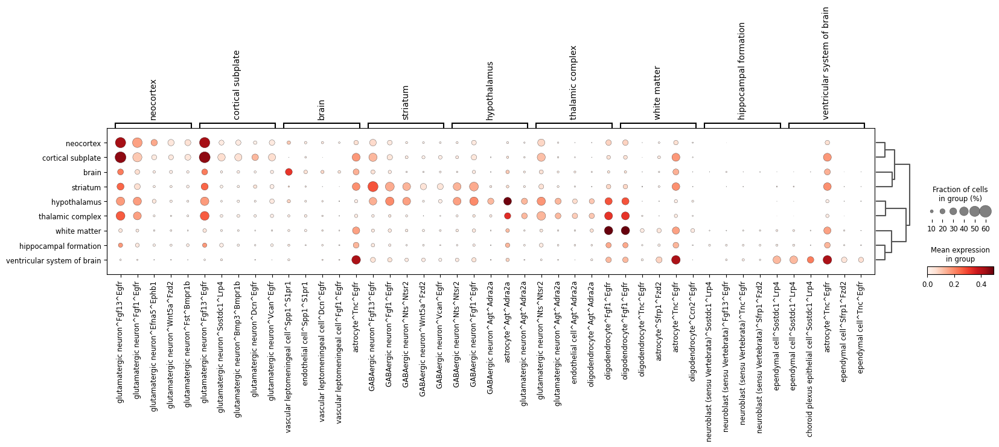

In [36]:
# make sure the grouping column exists & is categorical
lrdata_astro_rec.obs["tissue"] = lrdata_astro_rec.obs["tissue"].astype("category")

# compute DE rankings
sc.tl.rank_genes_groups(
    lrdata_astro_rec,
    groupby="tissue",
    method="wilcoxon",   # or "t-test"
    use_raw=False,
    key_added="rank_genes_groups_tissue"
)

# (optional) precompute dendrogram for nicer ordering
sc.tl.dendrogram(lrdata_astro_rec, groupby="tissue")

# now plot
sc.pl.rank_genes_groups_dotplot(
    lrdata_astro_rec,
    n_genes=5,
    dendrogram=True,
    use_raw=False,
    groupby="tissue",
    key="rank_genes_groups_tissue"  # important if you used key_added
)


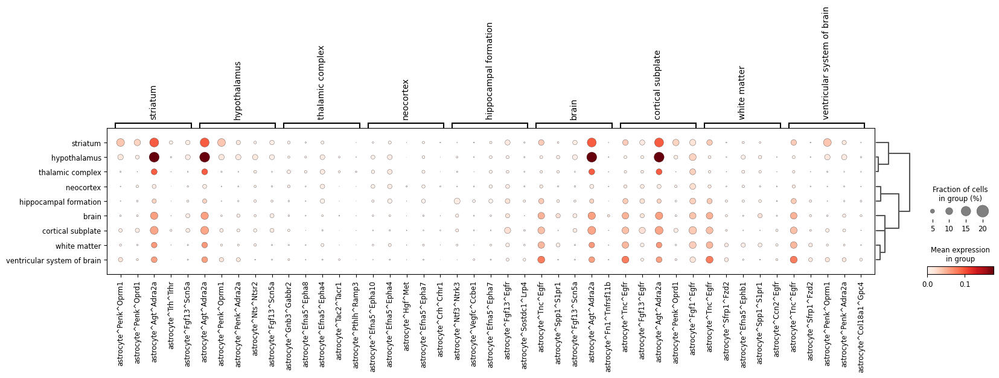

In [48]:
# make sure the grouping column exists & is categorical
lrdata_astro_sender.obs["tissue"] = lrdata_astro_sender.obs["tissue"].astype("category")

# compute DE rankings
sc.tl.rank_genes_groups(
    lrdata_astro_sender,
    groupby="tissue",
    method="wilcoxon",   # or "t-test"
    use_raw=False,
    key_added="rank_genes_groups_tissue"
)

# (optional) precompute dendrogram for nicer ordering
sc.tl.dendrogram(lrdata_astro_sender, groupby="tissue")

# now plot
sc.pl.rank_genes_groups_dotplot(
    lrdata_astro_sender,
    n_genes=5,
    dendrogram=True,
    use_raw=False,
    groupby="tissue",
    key="rank_genes_groups_tissue"  # important if you used key_added
)


In [72]:
interaction = "astrocyte^Tnc^Egfr"
cell_type_col = "cell_type"
comp = interaction.split("^")
spatial_key = "X_spatial_coords"

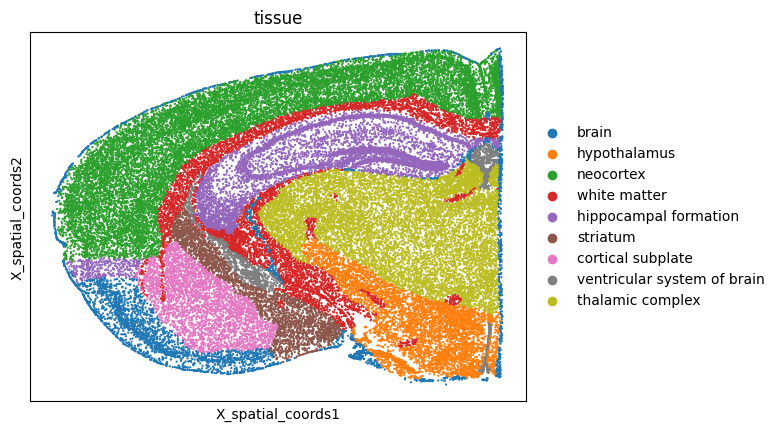

In [70]:
sc.pl.embedding(lrdata_astro_sender, basis=spatial_key, color="tissue", s=10)  

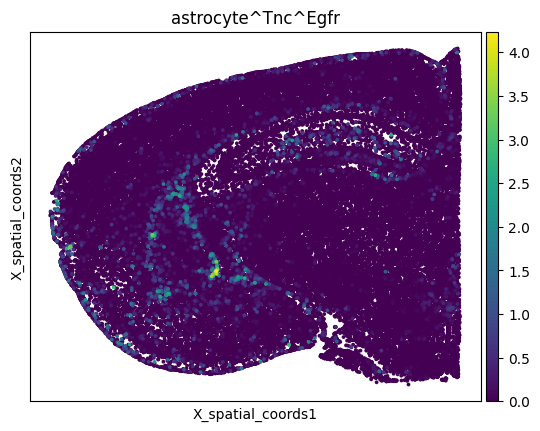

In [75]:
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=30)  

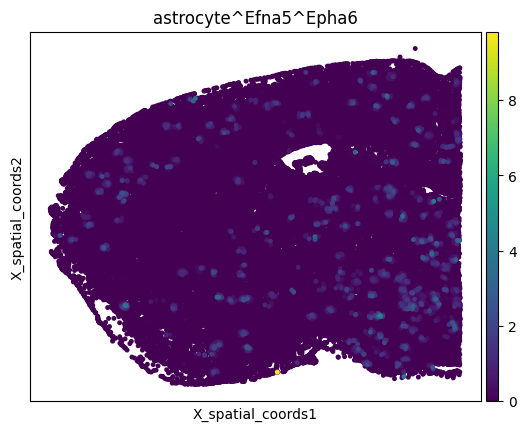

In [212]:
interaction = "astrocyte^Efna5^Epha6"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=50) 

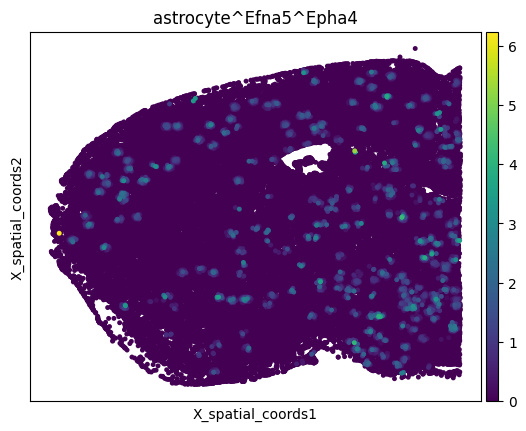

In [213]:
interaction = "astrocyte^Efna5^Epha4"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=50) 

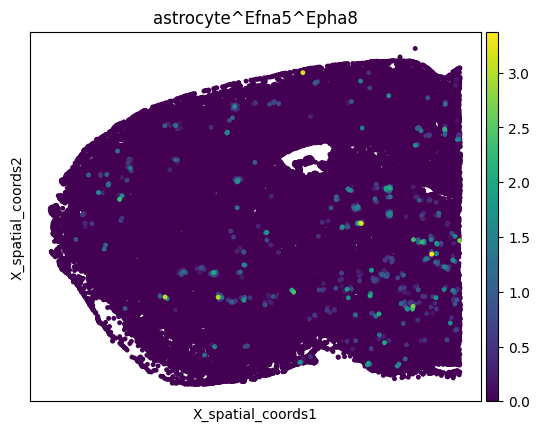

In [214]:
interaction = "astrocyte^Efna5^Epha8"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=50) 

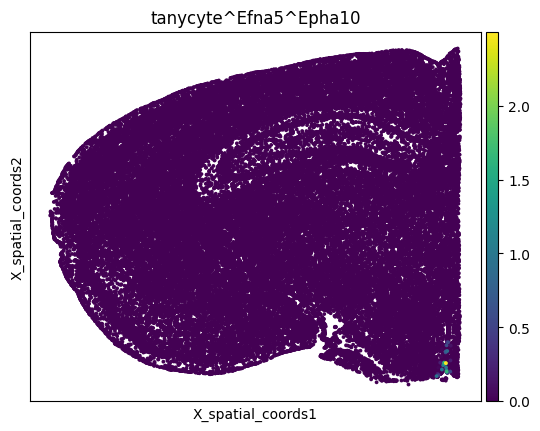

In [78]:
interaction = "tanycyte^Efna5^Epha10"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=30) 

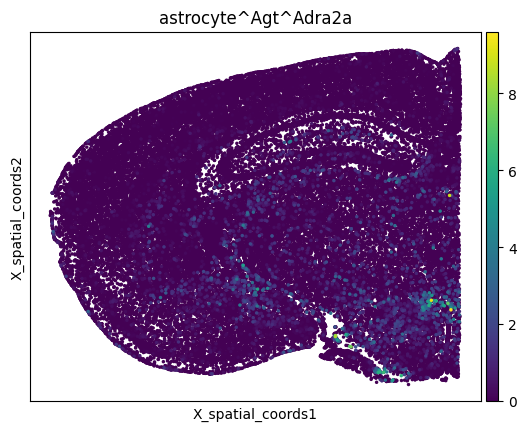

In [82]:
interaction = "astrocyte^Agt^Adra2a"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=25) 

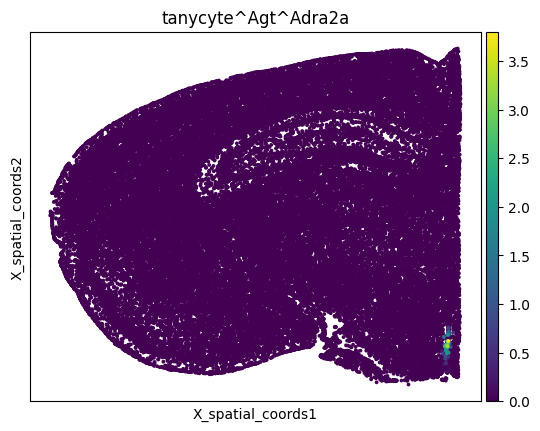

In [76]:
interaction = "tanycyte^Agt^Adra2a"
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=30)  

In [ ]:
lrdata_astro_sender["tissue"]

In [54]:
lrdata_astro_sender.obs["tissue_cell_type"] = lrdata_astro_sender.obs["tissue"].astype(str) + "_" + lrdata_astro_sender.obs["cell_type"].astype(str)

In [ ]:
for tissue in lrdata_astro_sender.obs['tissue'].unique():
    subset = lrdata_astro_sender[lrdata_astro_sender.obs['tissue'] == tissue]
    sc.pl.violin(
        subset,
        keys=interaction,
        groupby=cell_type_col,
        show=False
    )
    plt.title(f"Tissue: {tissue}")
    plt.xticks(rotation=90)
    plt.show()


In [59]:
ax = sc.pl.violin(
    lrdata_astro_sender,
    keys=interaction,
    splitby='tissue', 
    groupby=cell_type_col,
    show=False
)
plt.xticks(rotation=90)  # rotate x-axis labels
plt.show()

AttributeError: FillBetweenPolyCollection.set() got an unexpected keyword argument 'splitby'

In [44]:
%%time
# PCA for dimension reduction further by UMAP for downstream analysis
sc.pp.pca(lrdata_astro_sender, n_comps=50)
sc.pp.neighbors(lrdata_astro_sender, metric="cosine")

CPU times: user 7.41 s, sys: 44.9 ms, total: 7.46 s
Wall time: 7.28 s


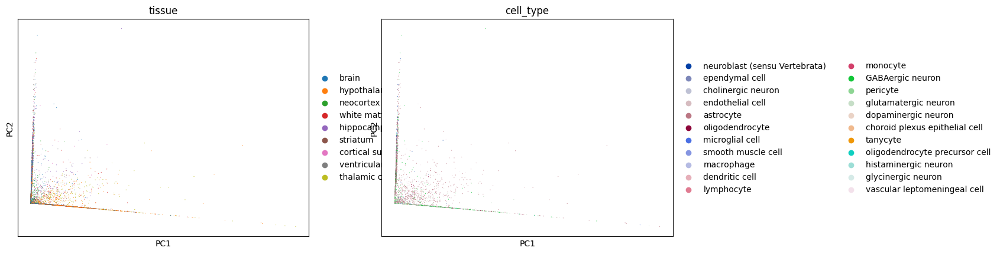

CPU times: user 1min 18s, sys: 115 ms, total: 1min 18s
Wall time: 1min 13s


In [45]:
%%time
sc.tl.umap(lrdata_astro_sender)
sc.pl.pca(lrdata_astro_sender, color=['tissue', 'cell_type'])

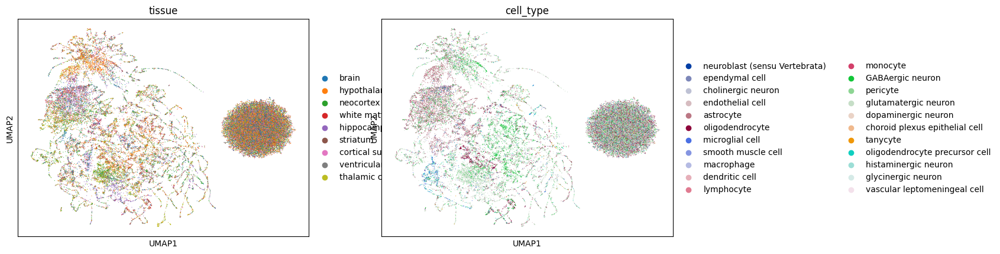

In [46]:
sc.pl.umap(
    lrdata_astro_sender, 
    color=['tissue', 'cell_type'], 
    show=True
)

----

In [224]:
interaction = "astrocyte^Efna5^Epha6"
cell_type_col = "cell_type"
comp = interaction.split("^")
spatial_key = "X_spatial_coords"

### Investigate single interaction

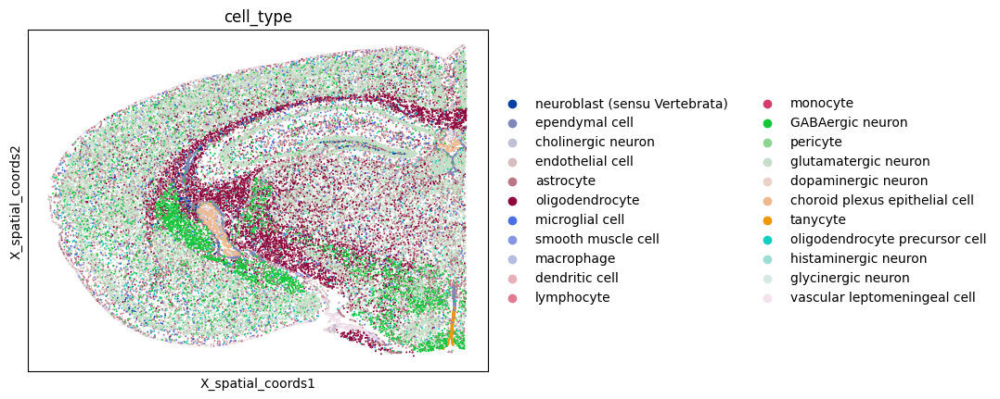

In [94]:
sc.pl.embedding(adata, basis=spatial_key, color=cell_type_col, s=8)  # s = point size

/scratch/jobs/38878331/ipykernel_272613/2578255125.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


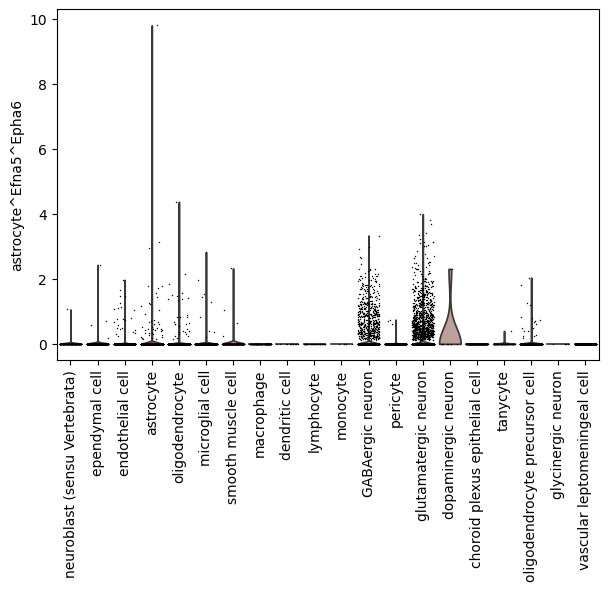

In [225]:
interaction = "astrocyte^Efna5^Epha6"

sc.pl.violin(
    lrdata,
    keys=interaction,
    groupby=cell_type_col,
    rotation=90,
    stripplot=True,
    jitter=0.4,
    multi_panel=False,
    show=False,       # allows you to modify before display
    legend=False      # disables the legend
)

plt.tight_layout()
plt.show()

/scratch/jobs/38878331/ipykernel_272613/1598291349.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


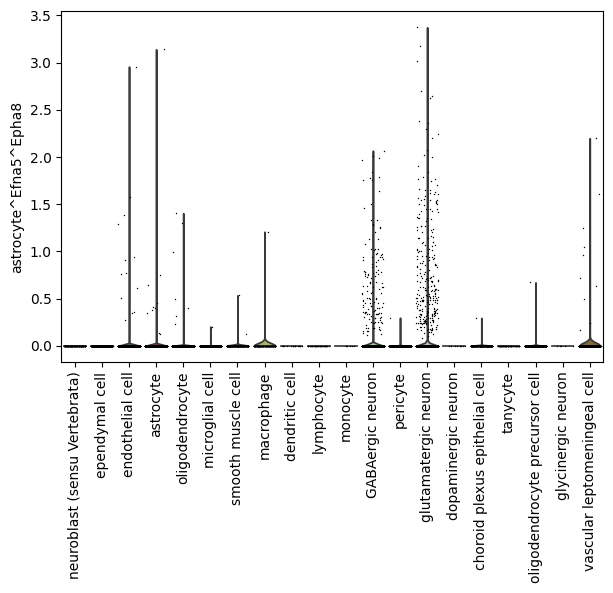

In [226]:
interaction = "astrocyte^Efna5^Epha8"

sc.pl.violin(
    lrdata,
    keys=interaction,
    groupby=cell_type_col,
    rotation=90,
    stripplot=True,
    jitter=0.4,
    multi_panel=False,
    show=False,       # allows you to modify before display
    legend=False      # disables the legend
)

plt.tight_layout()
plt.show()

/scratch/jobs/38878331/ipykernel_272613/2483215124.py:15: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


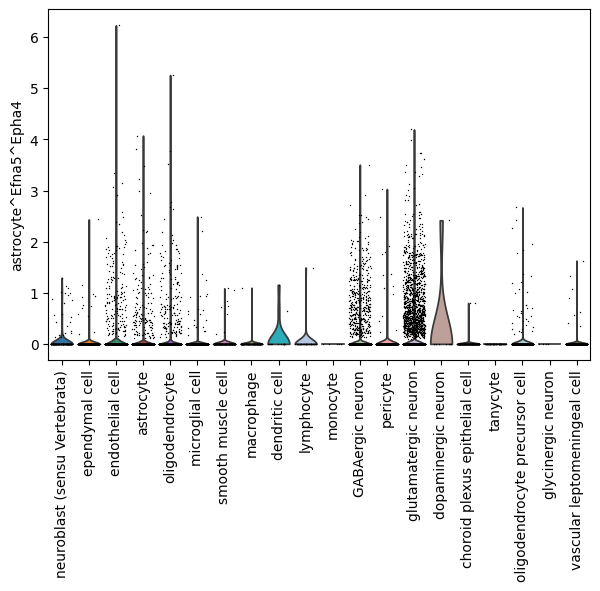

In [227]:
interaction = "astrocyte^Efna5^Epha4"

sc.pl.violin(
    lrdata,
    keys=interaction,
    groupby=cell_type_col,
    rotation=90,
    stripplot=True,
    jitter=0.4,
    multi_panel=False,
    show=False,       # allows you to modify before display
    legend=False      # disables the legend
)

plt.tight_layout()
plt.show()

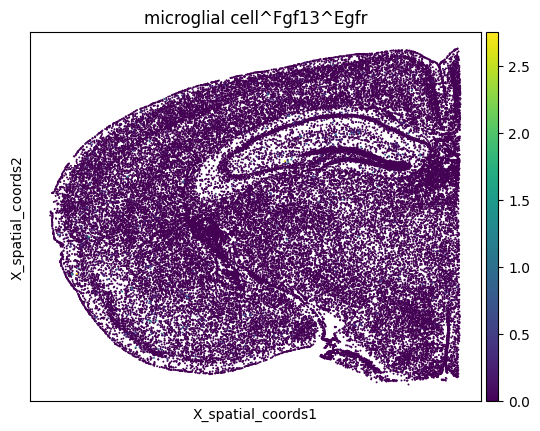

In [96]:
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=8)  

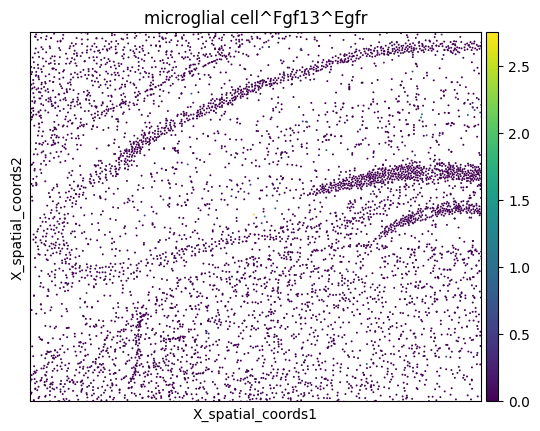

In [97]:
import numpy as np
from scipy.sparse import issparse
from scipy.ndimage import gaussian_filter
import scanpy as sc

A = lrdata
XY = A.obsm[spatial_key]                  # (n,2) spatial coords
key = interaction                         # feature name in var_names

# 1) expression vector (sparse-safe)
Xcol = A[:, key].X
vals = Xcol.toarray().ravel() if issparse(Xcol) else np.asarray(Xcol).ravel()

# keep only nonzero to avoid noise
nz = vals > 0
XY_nz  = XY[nz]
vals_nz = vals[nz]
if XY_nz.size == 0:
    raise ValueError("All-zero expression for this feature; nothing to zoom to.")

# 2) make a coarse heatmap of expression (mean expression per bin)
# choose number of bins; larger = finer grid (adjust if needed)
nbins = 120
x_edges = np.linspace(XY[:,0].min(), XY[:,0].max(), nbins+1)
y_edges = np.linspace(XY[:,1].min(), XY[:,1].max(), nbins+1)

sum_heat, _, _   = np.histogram2d(XY_nz[:,0], XY_nz[:,1], bins=[x_edges, y_edges], weights=vals_nz)
count_heat, _, _ = np.histogram2d(XY_nz[:,0], XY_nz[:,1], bins=[x_edges, y_edges])

mean_heat = np.divide(sum_heat, count_heat, out=np.zeros_like(sum_heat), where=count_heat>0)

# optional: smooth to reduce speckle
mean_heat = gaussian_filter(mean_heat, sigma=1.2)

# 3) find the peak bin -> its center coord
imax = np.unravel_index(np.argmax(mean_heat), mean_heat.shape)
cx = 0.5*(x_edges[imax[0]] + x_edges[imax[0]+1])
cy = 0.5*(y_edges[imax[1]] + y_edges[imax[1]+1])

# 4) pick bright points near the peak to define the window
#    - brightness: top quantile of expression
#    - locality: within a radius around (cx, cy)
q_expr = 0.95                      # tighten/loosen intensity cutoff
thr = np.quantile(vals_nz, q_expr)

# radius as a fraction of tissue size (tweak if needed)
xr = np.ptp(XY[:,0]); yr = np.ptp(XY[:,1])
R  = 0.10 * max(xr, yr)            # 10% of slide extent

dx = XY[:,0] - cx
dy = XY[:,1] - cy
near_peak = (dx*dx + dy*dy) <= R*R
bright    = vals >= thr
sel = near_peak & bright

# if too few points, relax to just 'near_peak'
if sel.sum() < 50:
    sel = near_peak

xs, ys = XY[sel,0], XY[sel,1]

# 5) compute padded bounds and zoom
pad_x = 0.05 * xr
pad_y = 0.05 * yr
xmin, xmax = xs.min()-pad_x, xs.max()+pad_x
ymin, ymax = ys.min()-pad_y, ys.max()+pad_y

fig = sc.pl.embedding(
    A, basis=spatial_key, color=interaction, s=8, show=False, return_fig=True
)
ax = fig.axes[0]
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
fig.show()

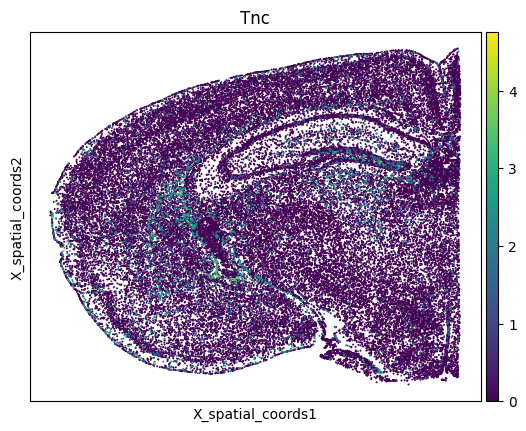

In [49]:
sc.pl.embedding(adata, basis=spatial_key, color=comp[1], s=8, use_raw=False)  # s = point size

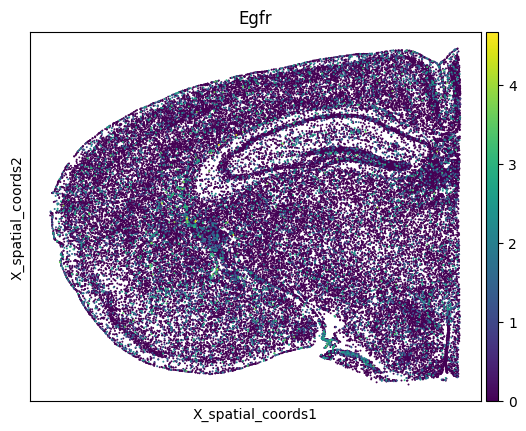

In [50]:
sc.pl.embedding(adata, basis=spatial_key, color=comp[2], s=8, use_raw=False)  # s = point size

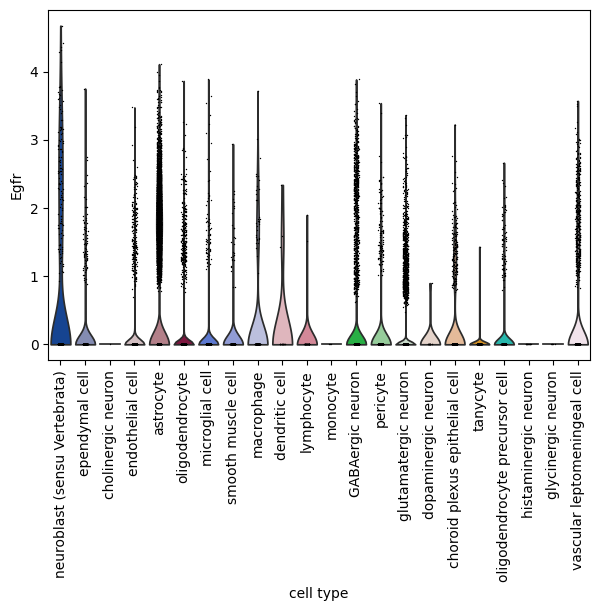

In [51]:
ax = sc.pl.violin(
    adata,
    keys=comp[2],
    groupby=cell_type_col,
    use_raw= False,
    show=False 
)
plt.xticks(rotation=90)  # rotate x-axis labels
plt.show()

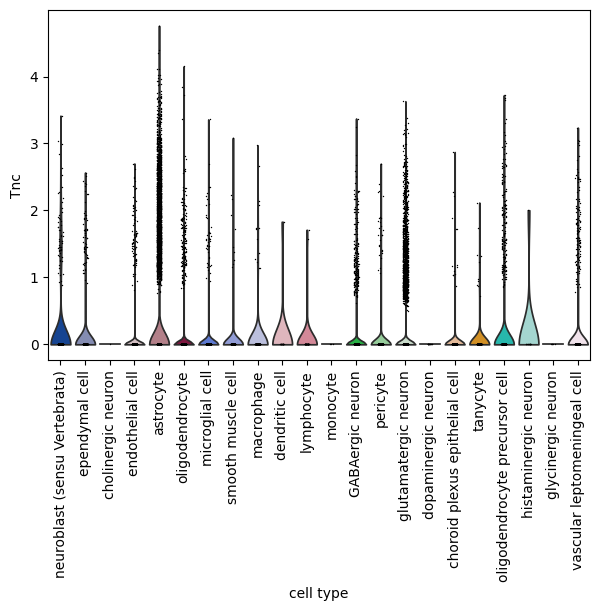

In [52]:
ax = sc.pl.violin(
    adata,
    keys=comp[1],
    groupby=cell_type_col,
    use_raw= False,
    show=False 
)
plt.xticks(rotation=90)  # rotate x-axis labels
plt.show()

### Comperhensive overview

In [111]:
sc.pp.calculate_qc_metrics(lrdata, inplace=True)

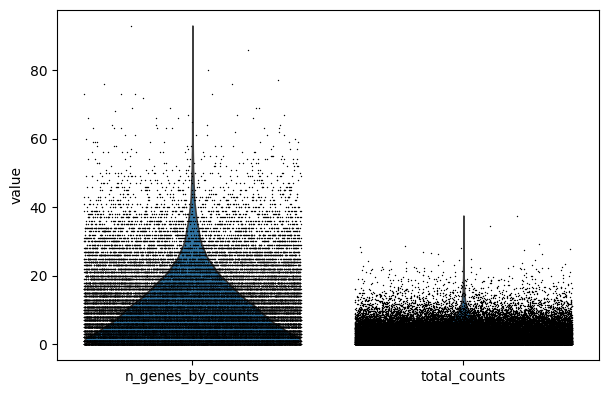

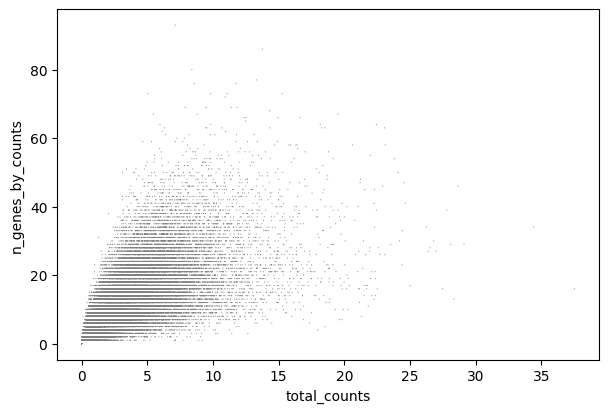

In [112]:
sc.pl.violin(lrdata, ['n_genes_by_counts', 'total_counts'], jitter=0.4)
sc.pl.scatter(lrdata, x='total_counts', y='n_genes_by_counts')


In [113]:
lrdata = lrdata[lrdata.obs['n_genes_by_counts'] > 10, :]     # keep cells with >200 genes
lrdata = lrdata[lrdata.obs['n_genes_by_counts'] < 60, :]     # keep cells with >200 genes

In [30]:
%%time
# PCA for dimension reduction further by UMAP for downstream analysis
sc.pp.pca(lrdata, n_comps=100)
sc.pp.neighbors(lrdata, metric="cosine")

CPU times: user 3.52 s, sys: 41.8 ms, total: 3.56 s
Wall time: 3.26 s


In [31]:
%%time
sc.tl.umap(lrdata)

CPU times: user 14.9 s, sys: 118 ms, total: 15 s
Wall time: 14.6 s


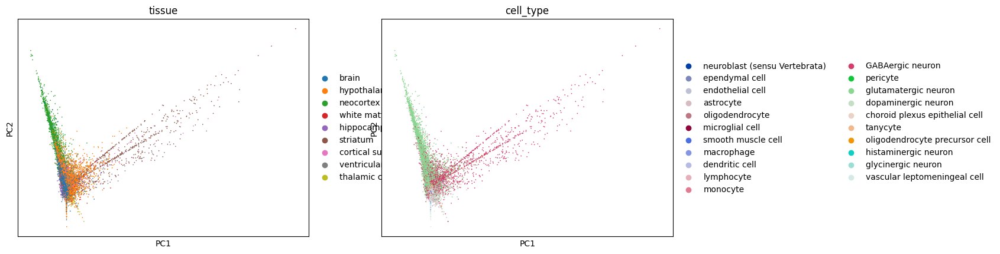

In [32]:
sc.pl.pca(lrdata, color=['tissue', 'cell_type'])

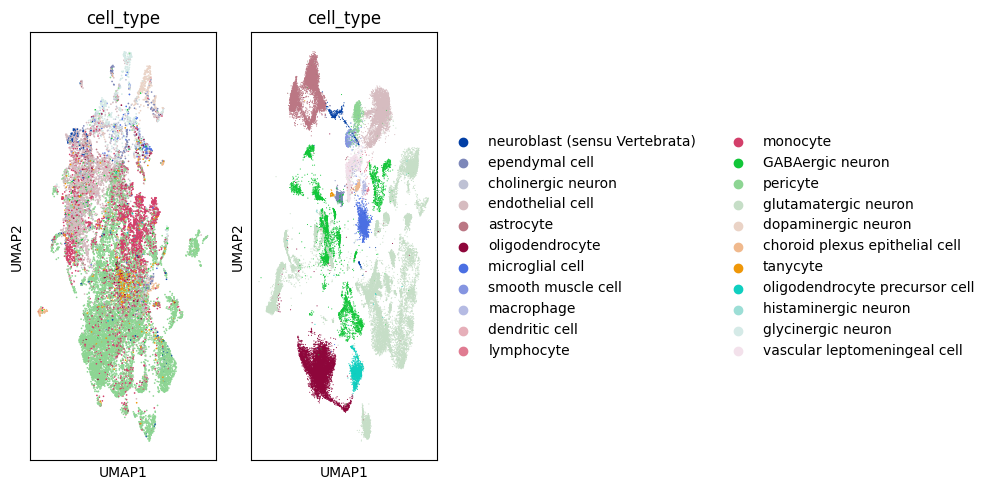

In [33]:
# Make a figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot lrdata UMAP on the left axis
sc.pl.umap(
    lrdata, 
    color=cell_type_col, 
    ax=axes[0], 
     legend_loc=None,
    show=False
)

# Plot adata UMAP on the right axis
sc.pl.umap(
    adata, 
    color=cell_type_col, 
    ax=axes[1], 
    show=False
)

plt.tight_layout()
plt.show()

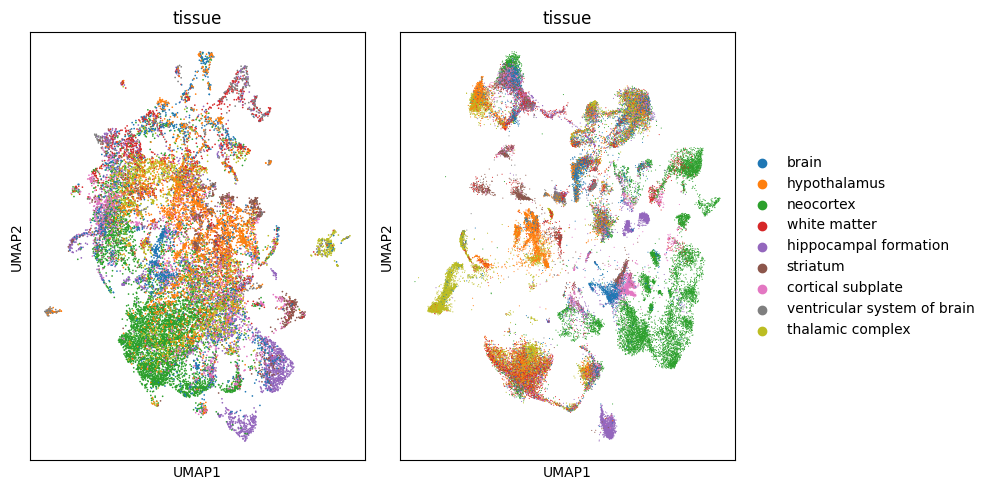

In [34]:
key_meta = "tissue"
# Make a figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot lrdata UMAP on the left axis
sc.pl.umap(
    lrdata, 
    color=key_meta, 
    ax=axes[0], 
     legend_loc=None,
    show=False
)

# Plot adata UMAP on the right axis
sc.pl.umap(
    adata, 
    color=key_meta, 
    ax=axes[1], 
    show=False
)

plt.tight_layout()
plt.show()


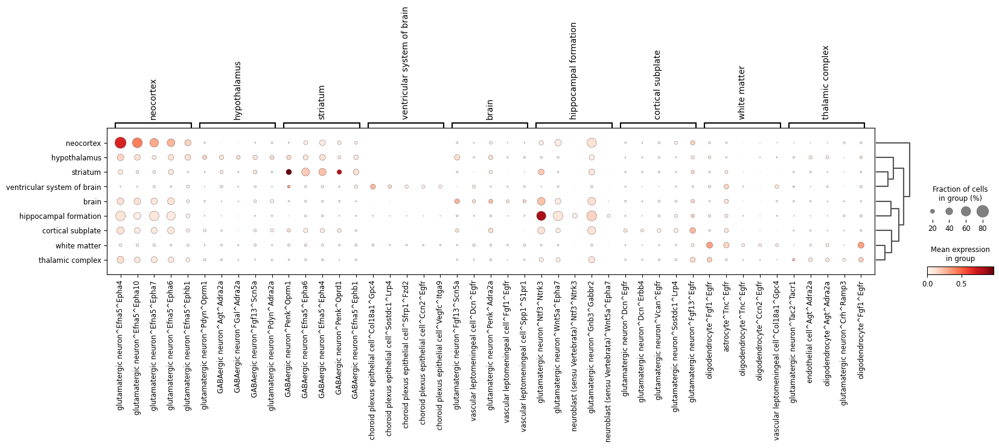

In [36]:
key_meta = "tissue"
min_cells = 30  # choose your threshold
counts = lrdata.obs[key_meta].value_counts()
ok_groups = counts[counts >= min_cells].index.tolist()

sc.tl.rank_genes_groups(
    lrdata,
    groupby=key_meta,
    groups=ok_groups,            # only test adequately sized groups
    layer="transformed",
    method="t-test_overestim_var",
    pts=True
)
sc.pl.rank_genes_groups_dotplot(lrdata, n_genes=5)

In [37]:
from typing import Optional, Sequence

In [ ]:
def plot_sender_ligand_to_receivers(
    adata,
    cell_type_key: str = "cell_type",
    receptors: Optional[Sequence[str]] = None,
    senders: Optional[Sequence[str]] = None,
    ligands: Optional[Sequence[str]] = None,
    min_pct: float = 0.05,
    mean_cutoff: Optional[float] = None,   # ← NEW PARAMETER
    max_dot_size: float = 500,
    min_dot_size: float = 10,
    figsize=(10, 8),
    cmap: str = "viridis",
    title: Optional[str] = None,
    log_color: bool = False,
):
    """
    Dot plot of cell–cell communication:
      x = 'sender cell type ^ ligand'
      y = 'receiver cell type ▸ receptor'
      dot color = mean signal per group
      dot size  = % of cells in that receiver group with value > 0

    Parameters
    ----------
    adata : AnnData
        Contains signal values in adata.X, sender–ligand–receptor names in var_names.
    cell_type_key : str
        Column in adata.obs for receiver cell type identity.
    mean_cutoff : float, optional
        Minimum mean signal to include a sender→receiver point.
    """

    # --- Handle sparse matrices gracefully ---
    X = adata.X
    try:
        import scipy.sparse as sp
        if sp.issparse(X):
            X = X.toarray()
    except Exception:
        pass
    X = np.asarray(X)

    # --- Parse sender, ligand, receptor ---
    parts = [str(v).split("^") for v in adata.var_names]
    parsed = pd.DataFrame(parts, columns=["sender", "ligand", "receptor"])
    parsed["feature"] = adata.var_names.values

    # Optional filtering
    if receptors is not None:
        parsed = parsed[parsed["receptor"].isin(receptors)]
    if senders is not None:
        parsed = parsed[parsed["sender"].isin(senders)]
    if ligands is not None:
        parsed = parsed[parsed["ligand"].isin(ligands)]
    if parsed.empty:
        raise ValueError("No features left after filtering.")

    # --- Melt adata into long form ---
    df_vals = pd.DataFrame(X[:, [list(adata.var_names).index(f) for f in parsed["feature"]]],
                           columns=parsed["feature"])
    df_vals["receiver_cell_type"] = adata.obs[cell_type_key].astype(str).values

    long_df = df_vals.melt(id_vars=["receiver_cell_type"], var_name="feature", value_name="value")
    long_df = long_df.merge(parsed, on="feature", how="left")

    # Composite labels
    long_df["sender_ligand"] = long_df["sender"] + "^" + long_df["ligand"]
    long_df["receiver_receptor"] = long_df["receiver_cell_type"] + " ▸ " + long_df["receptor"]

    # --- Group and summarize ---
    grouped = long_df.groupby(["receiver_receptor", "sender_ligand"], observed=True)
    stats = grouped.agg(
        mean_value=("value", "mean"),
        pct_expressing=("value", lambda x: (np.asarray(x) > 0).mean()),
    ).reset_index()

    # --- Apply cutoffs ---
    stats = stats[stats["pct_expressing"] >= min_pct]
    if mean_cutoff is not None:
        stats = stats[stats["mean_value"] >= mean_cutoff]

    if stats.empty:
        raise ValueError("No points left after applying cutoffs. Try relaxing 'min_pct' or 'mean_cutoff'.")

    # --- Order axes ---
    rr_split = stats["receiver_receptor"].str.split(" ▸ ", n=1, expand=True)
    stats["receiver"] = rr_split[0]
    stats["receptor"] = rr_split[1]
    y_order = (stats[["receiver", "receptor", "receiver_receptor"]]
               .drop_duplicates()
               .sort_values(["receiver", "receptor"]))["receiver_receptor"].tolist()
    x_order = list(dict.fromkeys(stats["sender_ligand"]))

    y_pos = {y: i for i, y in enumerate(y_order)}
    x_pos = {x: i for i, x in enumerate(x_order)}
    stats["x"] = stats["sender_ligand"].map(x_pos)
    stats["y"] = stats["receiver_receptor"].map(y_pos)

    # --- Scale dot sizes ---
    size_scaled = (
        min_dot_size +
        (stats["pct_expressing"] - stats["pct_expressing"].min()) /
        (stats["pct_expressing"].max() - stats["pct_expressing"].min() + 1e-6)
        * (max_dot_size - min_dot_size)
    )

    color_values = np.log1p(stats["mean_value"]) if log_color else stats["mean_value"]

    # --- Plot ---
    fig, ax = plt.subplots(figsize=figsize)
    sc = ax.scatter(stats["x"], stats["y"], s=size_scaled,
                    c=color_values, cmap=cmap, alpha=0.9,
                    edgecolor="k", linewidth=0.4)
    ax.set_xticks(range(len(x_order)))
    ax.set_xticklabels(x_order, rotation=45, ha="right")
    ax.set_yticks(range(len(y_order)))
    ax.set_yticklabels(y_order)
    ax.set_xlabel("Sender cell type ^ Ligand")
    ax.set_ylabel("Receiver cell type ▸ Receptor")

    ttl = title or "Sender→Receiver signaling landscape\n(size = % expressing; color = mean signal)"
    ax.set_title(ttl)
    cb = plt.colorbar(sc, ax=ax)
    cb.set_label("Mean signal (log)" if log_color else "Mean signal")

    ax.grid(axis="y", linestyle=":", alpha=0.3)
    plt.tight_layout()
    return fig, ax


In [189]:
lrdata.obs["major_brain_region"].value_counts()

major_brain_region
Isocortex              6450
Hypothalamus           2651
Hippocampus            2525
Thalamus               2407
Fiber_tracts           1490
Cortical_subplate      1393
Striatum               1297
Olfactory               910
Ventricular_systems     649
Name: count, dtype: int64

In [106]:
lrdata[lrdata.obs["major_brain_region"] == "Hippocampus"]

View of AnnData object with n_obs × n_vars = 1921 × 1360
    obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    uns: 'citation', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title', 'moranI', 'cell_type_colors', 'tissue_colors'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'
    layers: 'transformed'
    obsp: 'spatial_connectivities'

In [190]:
lrdata.var_names

Index(['glutamatergic neuron^Ntf3^Ntrk3', 'tanycyte^Wnt5a^Fzd5',
       'neuroblast (sensu Vertebrata)^Ntf3^Ntrk3',
       'glutamatergic neuron^Efna5^Epha4', 'tanycyte^Efna5^Ephb1',
       'neuroblast (sensu Vertebrata)^Efna5^Epha4',
       'neuroblast (sensu Vertebrata)^Wnt5a^Epha7',
       'glutamatergic neuron^Gnb3^Gabbr2',
       'neuroblast (sensu Vertebrata)^Efna5^Epha7', 'tanycyte^Sfrp2^Fzd5',
       ...
       'dopaminergic neuron^Penk^Adra2a', 'smooth muscle cell^Fn1^Tshr',
       'neuroblast (sensu Vertebrata)^Pdyn^Oprm1', 'astrocyte^Dcn^Met',
       'dendritic cell^Dcn^Erbb4', 'astrocyte^Fn1^Cd44',
       'oligodendrocyte^Fn1^Cd44', 'microglial cell^Fn1^Cd79a',
       'smooth muscle cell^Lama1^Cd44', 'macrophage^Pdyn^Oprm1'],
      dtype='object', length=1360)

In [199]:
lrdata.obs.columns

Index(['donor_id', 'development_stage_ontology_term_id',
       'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id',
       'disease_ontology_term_id', 'tissue_ontology_term_id',
       'cell_type_ontology_term_id', 'assay_ontology_term_id',
       'suspension_type', 'cluster_id_transfer', 'subclass_transfer',
       'cluster_confidence_score', 'subclass_confidence_score',
       'high_quality_transfer', 'major_brain_region', 'ccf_region_name',
       'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type',
       'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity',
       'development_stage', 'observation_joinid', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'],
      dtype='object')

In [203]:
lrdata.obs["cell_type_tissue"] = (lrdata.obs["tissue"]).astype(str) + "_" + (lrdata.obs["cell_type"]).astype(str)

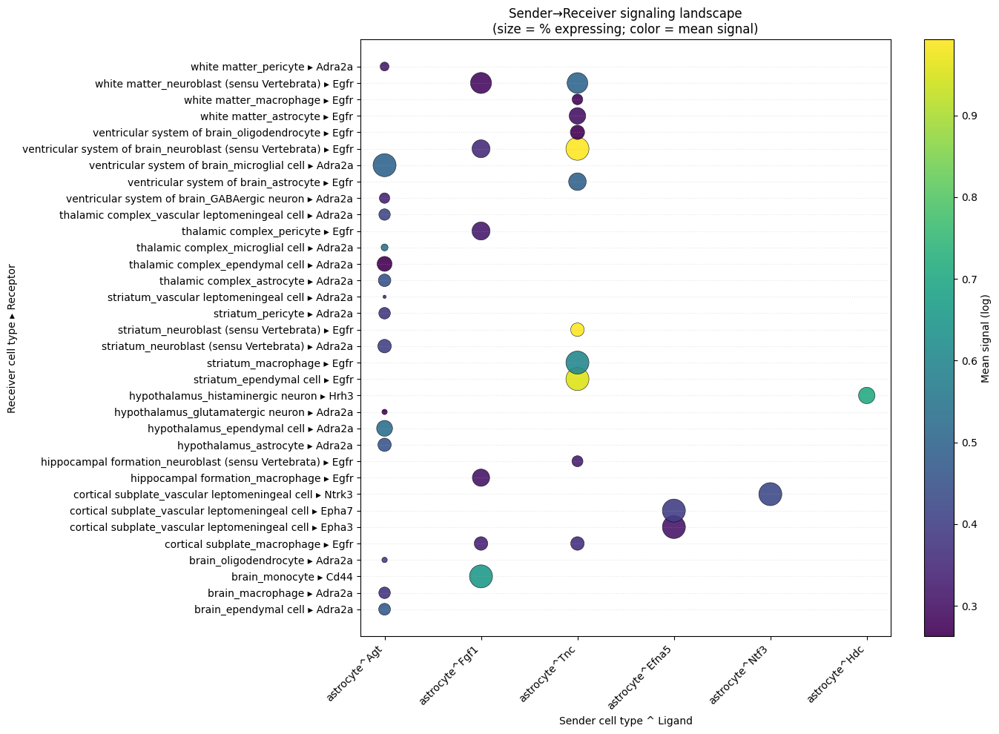

In [204]:
#lrdata2 = lrdata[lrdata.obs["major_brain_region"] == "Hippocampus"]
fig, ax = plot_sender_ligand_to_receivers(
    lrdata,
    cell_type_key="cell_type_tissue",
    min_pct=0.1,
    senders=["astrocyte"],
    mean_cutoff=0.3,      # <-- only keep interactions with mean ≥ 0.3
    figsize=(14, 10),
    log_color=True
)
plt.show()

In [224]:
interaction = "astrocyte^Tnc^Egfr"

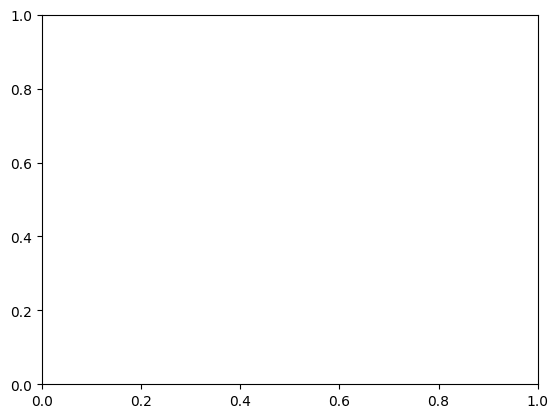

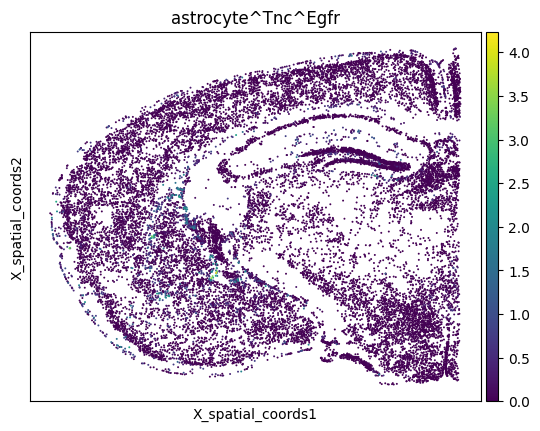

In [225]:
sc.pl.embedding(lrdata, basis=spatial_key, color=interaction, s=8)  

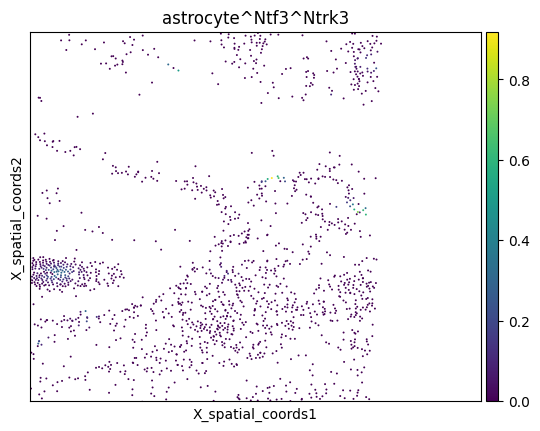

In [221]:
import numpy as np
from scipy.sparse import issparse
from scipy.ndimage import gaussian_filter
import scanpy as sc

sc.settings.autoshow = True
A = lrdata
XY = A.obsm[spatial_key]                  # (n,2) spatial coords
key = interaction                         # feature name in var_names

# 1) expression vector (sparse-safe)
Xcol = A[:, key].X
vals = Xcol.toarray().ravel() if issparse(Xcol) else np.asarray(Xcol).ravel()

# keep only nonzero to avoid noise
nz = vals > 0
XY_nz  = XY[nz]
vals_nz = vals[nz]
if XY_nz.size == 0:
    raise ValueError("All-zero expression for this feature; nothing to zoom to.")

# 2) make a coarse heatmap of expression (mean expression per bin)
# choose number of bins; larger = finer grid (adjust if needed)
nbins = 120
x_edges = np.linspace(XY[:,0].min(), XY[:,0].max(), nbins+1)
y_edges = np.linspace(XY[:,1].min(), XY[:,1].max(), nbins+1)

sum_heat, _, _   = np.histogram2d(XY_nz[:,0], XY_nz[:,1], bins=[x_edges, y_edges], weights=vals_nz)
count_heat, _, _ = np.histogram2d(XY_nz[:,0], XY_nz[:,1], bins=[x_edges, y_edges])

mean_heat = np.divide(sum_heat, count_heat, out=np.zeros_like(sum_heat), where=count_heat>0)

# optional: smooth to reduce speckle
mean_heat = gaussian_filter(mean_heat, sigma=1.2)

# 3) find the peak bin -> its center coord
imax = np.unravel_index(np.argmax(mean_heat), mean_heat.shape)
cx = 0.5*(x_edges[imax[0]] + x_edges[imax[0]+1])
cy = 0.5*(y_edges[imax[1]] + y_edges[imax[1]+1])

# 4) pick bright points near the peak to define the window
#    - brightness: top quantile of expression
#    - locality: within a radius around (cx, cy)
q_expr = 0.95                      # tighten/loosen intensity cutoff
thr = np.quantile(vals_nz, q_expr)

# radius as a fraction of tissue size (tweak if needed)
xr = np.ptp(XY[:,0]); yr = np.ptp(XY[:,1])
R  = 0.10 * max(xr, yr)            # 10% of slide extent

dx = XY[:,0] - cx
dy = XY[:,1] - cy
near_peak = (dx*dx + dy*dy) <= R*R
bright    = vals >= thr
sel = near_peak & bright

# if too few points, relax to just 'near_peak'
if sel.sum() < 50:
    sel = near_peak

xs, ys = XY[sel,0], XY[sel,1]

# 5) compute padded bounds and zoom
pad_x = 0.05 * xr
pad_y = 0.05 * yr
xmin, xmax = xs.min()-pad_x, xs.max()+pad_x
ymin, ymax = ys.min()-pad_y, ys.max()+pad_y

fig = sc.pl.embedding(
    A, basis=spatial_key, color=interaction, s=8, show=False, return_fig=True
)
ax = fig.axes[0]
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.show()


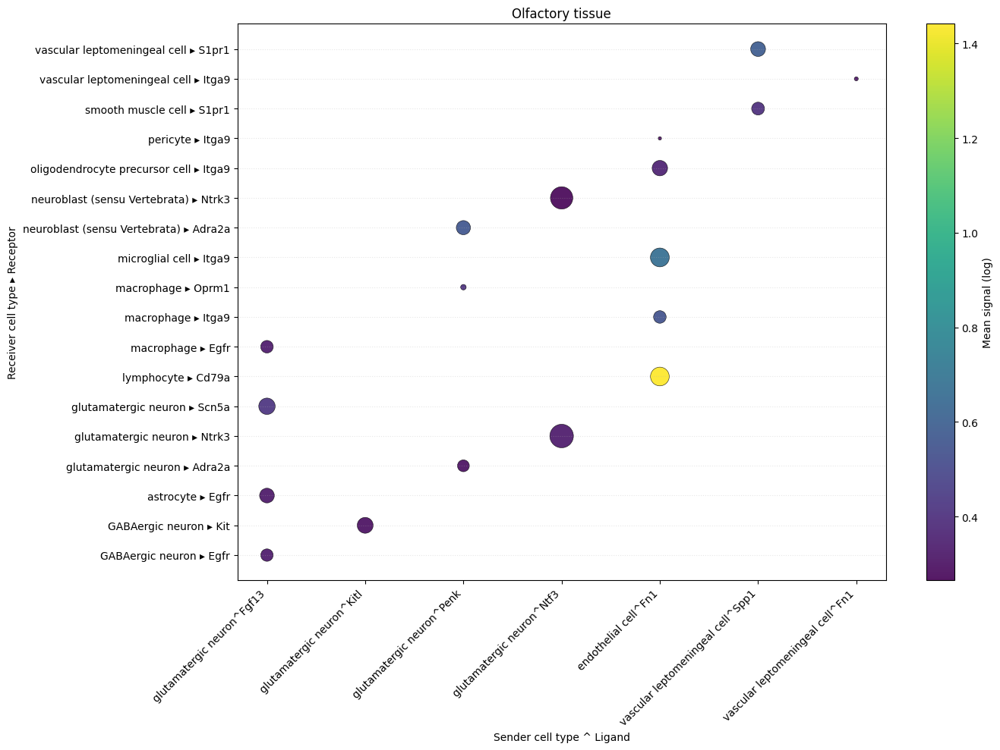

In [108]:
lrdata2 = lrdata[lrdata.obs["major_brain_region"] == "Olfactory"]
fig, ax = plot_sender_ligand_to_receivers(
    lrdata2,
    cell_type_key="cell_type",
    min_pct=0.1,
    mean_cutoff=0.3,      # <-- only keep interactions with mean ≥ 0.3
    figsize=(14, 10),
    log_color=True,
    title="Olfactory tissue"
)
plt.show()

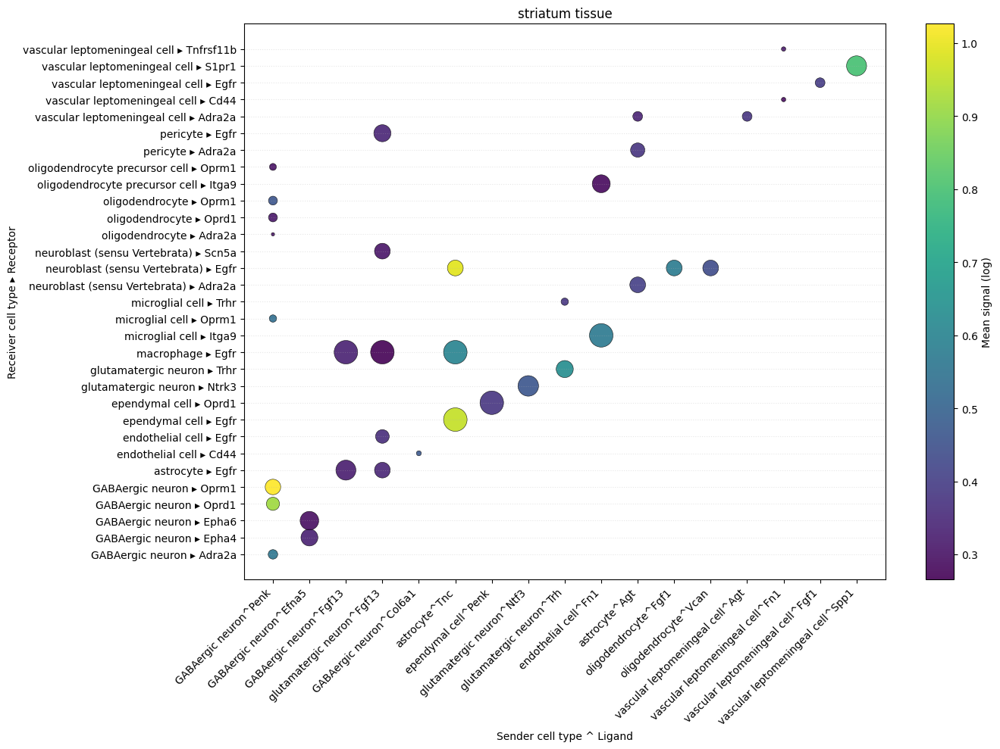

In [71]:
lrdata3 = lrdata[lrdata.obs["tissue"] == "striatum"]
fig, ax = plot_sender_ligand_to_receivers(
    lrdata3,
    cell_type_key="cell_type",
    min_pct=0.1,
    mean_cutoff=0.3,      #only keep interactions with mean ≥ 0.3
    figsize=(14, 10),
    log_color=True,
    title = "striatum tissue"
)
plt.show()

In [73]:
lrdata.obs["cell_type"].value_counts()

cell_type
glutamatergic neuron              10446
GABAergic neuron                   3195
astrocyte                          3194
vascular leptomeningeal cell        700
oligodendrocyte                     536
endothelial cell                    481
oligodendrocyte precursor cell      430
choroid plexus epithelial cell      344
microglial cell                     247
ependymal cell                      214
neuroblast (sensu Vertebrata)       195
pericyte                            138
tanycyte                            122
smooth muscle cell                  116
macrophage                           60
histaminergic neuron                 12
dopaminergic neuron                   9
lymphocyte                            8
dendritic cell                        7
monocyte                              1
glycinergic neuron                    1
Name: count, dtype: int64

In [ ]:
lrdata.obs["cell_type_tissue"] = (lrdata.obs["cell_type"]).astype(str) + "_" + (lrdata.obs["tissue"]).astype(str)

In [87]:
lrdata.obs["cell_type_tissue"].value_counts()

cell_type_tissue
glutamatergic neuron_neocortex                     4426
glutamatergic neuron_hippocampal formation         1665
glutamatergic neuron_thalamic complex              1204
glutamatergic neuron_hypothalamus                   931
glutamatergic neuron_cortical subplate              786
                                                   ... 
vascular leptomeningeal cell_cortical subplate        1
macrophage_striatum                                   1
glycinergic neuron_hypothalamus                       1
neuroblast (sensu Vertebrata)_cortical subplate       1
dendritic cell_brain                                  1
Name: count, Length: 129, dtype: int64

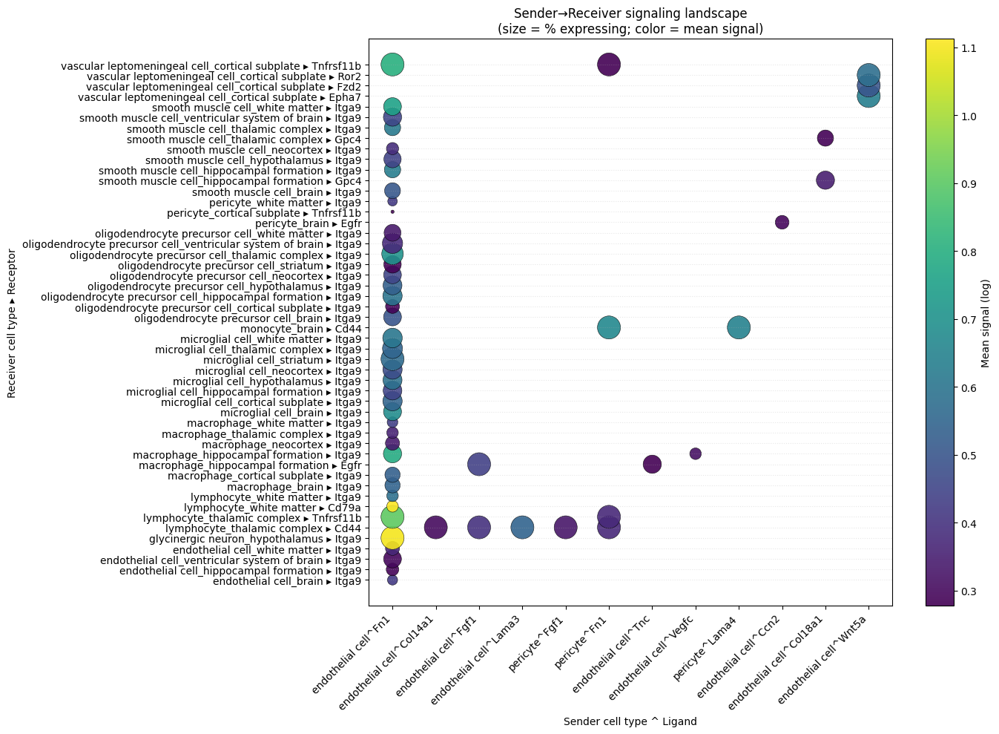

In [89]:
fig, ax = plot_sender_ligand_to_receivers(
    lrdata,
    cell_type_key="cell_type_tissue",
    min_pct=0.1,
    mean_cutoff=0.3,      #only keep interactions with mean ≥ 0.3
    figsize=(14, 10),
    log_color=True,
    #receptors= ["",""],
    senders= ["pericyte", "endothelial cell"],
    #ligands = None,
)
plt.show()

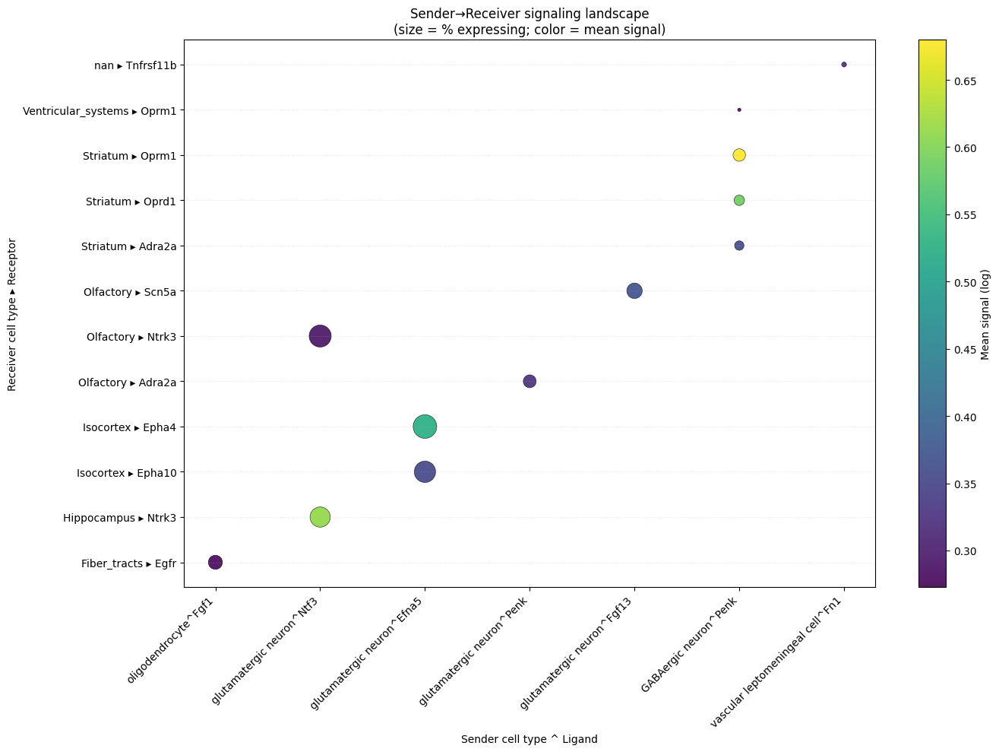

In [67]:
fig, ax = plot_sender_ligand_to_receivers(
    lrdata,
    cell_type_key="major_brain_region",
    min_pct=0.1,
    mean_cutoff=0.3,      #only keep interactions with mean ≥ 0.3
    figsize=(14, 10),
    log_color=True
)
plt.show()